<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Analyze-single-cell-tracks" data-toc-modified-id="Analyze-single-cell-tracks-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Analyze single cell tracks</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Load-data" data-toc-modified-id="Load-data-1.0.1"><span class="toc-item-num">1.0.1&nbsp;&nbsp;</span>Load data</a></span></li><li><span><a href="#Process-data" data-toc-modified-id="Process-data-1.0.2"><span class="toc-item-num">1.0.2&nbsp;&nbsp;</span>Process data</a></span></li></ul></li></ul></li><li><span><a href="#(1)-Displacement-profiles" data-toc-modified-id="(1)-Displacement-profiles-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>(1) Displacement profiles</a></span><ul class="toc-item"><li><span><a href="#Plot-all-2D-cell-tracks" data-toc-modified-id="Plot-all-2D-cell-tracks-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Plot all 2D cell tracks</a></span></li><li><span><a href="#Tracked-cells-over-time" data-toc-modified-id="Tracked-cells-over-time-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Tracked cells over time</a></span></li></ul></li><li><span><a href="#Cell-velocities" data-toc-modified-id="Cell-velocities-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Cell velocities</a></span></li><li><span><a href="#Mean-squared-displacements" data-toc-modified-id="Mean-squared-displacements-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Mean-squared displacements</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Average-over-cells" data-toc-modified-id="Average-over-cells-4.0.1"><span class="toc-item-num">4.0.1&nbsp;&nbsp;</span>Average over cells</a></span><ul class="toc-item"><li><span><a href="#Average-over-experiments" data-toc-modified-id="Average-over-experiments-4.0.1.1"><span class="toc-item-num">4.0.1.1&nbsp;&nbsp;</span>Average over experiments</a></span></li><li><span><a href="#Average-cell-velocities" data-toc-modified-id="Average-cell-velocities-4.0.1.2"><span class="toc-item-num">4.0.1.2&nbsp;&nbsp;</span>Average cell velocities</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#(2)-Persistence-of-cell-motion" data-toc-modified-id="(2)-Persistence-of-cell-motion-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>(2) Persistence of cell motion</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Approach-1:-&quot;Fraction-of-efficient-movement&quot;" data-toc-modified-id="Approach-1:-&quot;Fraction-of-efficient-movement&quot;-5.0.1"><span class="toc-item-num">5.0.1&nbsp;&nbsp;</span>Approach 1: "Fraction of efficient movement"</a></span><ul class="toc-item"><li><span><a href="#Combine-experiments" data-toc-modified-id="Combine-experiments-5.0.1.1"><span class="toc-item-num">5.0.1.1&nbsp;&nbsp;</span>Combine experiments</a></span></li></ul></li><li><span><a href="#Approach-2:-velocity-correlation-functions" data-toc-modified-id="Approach-2:-velocity-correlation-functions-5.0.2"><span class="toc-item-num">5.0.2&nbsp;&nbsp;</span>Approach 2: velocity correlation functions</a></span></li></ul></li></ul></li><li><span><a href="#(3)-Spatial-correlations" data-toc-modified-id="(3)-Spatial-correlations-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>(3) Spatial correlations</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Spatial-velocity-correlations" data-toc-modified-id="Spatial-velocity-correlations-6.0.1"><span class="toc-item-num">6.0.1&nbsp;&nbsp;</span>Spatial velocity correlations</a></span><ul class="toc-item"><li><span><a href="#Average-over-experiments" data-toc-modified-id="Average-over-experiments-6.0.1.1"><span class="toc-item-num">6.0.1.1&nbsp;&nbsp;</span>Average over experiments</a></span></li></ul></li><li><span><a href="#Check-that-the-number-of-pairs-of-cells-in-each-of-the-bins-is-roughly-equal" data-toc-modified-id="Check-that-the-number-of-pairs-of-cells-in-each-of-the-bins-is-roughly-equal-6.0.2"><span class="toc-item-num">6.0.2&nbsp;&nbsp;</span>Check that the number of pairs of cells in each of the bins is roughly equal</a></span></li><li><span><a href="#Pairwise-distance-statistics" data-toc-modified-id="Pairwise-distance-statistics-6.0.3"><span class="toc-item-num">6.0.3&nbsp;&nbsp;</span>Pairwise distance statistics</a></span></li></ul></li></ul></li></ul></div>

# Analyze single cell tracks

Analyze cell motility in the osteogenic front. Input data consists of manually tracked xy-positions of individual cells, both near the front as well as in the bulk away from the front.

### Load data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from math import ceil
import seaborn as sns
sns.set_context("notebook", font_scale=1)

cwd = os.getcwd(); print("Working dir: " + cwd)

folder_figures = "/Users/dang/Documents/Projects/Tabler_skull/Figures/Cell_tracks_Adrian/";
im_label = "Cell_tracks_analyzed_"

Working dir: /Users/dang/Documents/Projects/Tabler_skull/Scripts/Scripts_python


In [2]:
# Disable warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# --- Input parameters ---
video_labels = ["190305", "190314", "200120", "020917"];
pix_per_micron_all = [4.400, 5.1040, 5.1040, 4.4034]; # Number of pixels per micron
names_compare = ["Bone Front", "In Bone", "Further In Bone"];
video_image_sizes = np.array([[859.55, 655], [1099.53, 562.5], [927.51, 769.01], [1054.42, 655.50] ]); # in microns
delta_t = 1/6; # time interval between slices in hrs

In [4]:
# Load files
data_path = "/Users/dang/Documents/Projects/Tabler_skull/Data_Adrian_cell_tracks/"
fname_templates = ["Results from MaxProjected_Stitched_Blurred_190305 ML1 OsxGFP Explant Video 1 (0-12hr) in um per min.csv",
                  "Results from MaxProjected_Stitched_Blurred_190314 ML1 OsxGFP Explant Video 1 (0-8hr) in um per sec.csv",
                   "Results from MaxProjected_Stitched_Blurred_200120 Live Imaging OsxGFP E1375 12 hours in um per sec.csv",
                  "Results from MAX_BLUR_20200414AQR_osx_E13 in um per min.csv"]
filenames_all = [["{} {}".format(x,y) for x in names_compare] for y in fname_templates ];
N_videos = len(fname_templates);
N_files_per_video = len(names_compare);
video_image_sizes_pix = [[int(pix_per_micron_all[i]*video_image_sizes[i, j]) for j in range(2)] for i in range(N_videos)]; # in pixels

loaded_data_all = [[None]*N_files_per_video for _ in range(N_videos)];
for i in range(N_videos):    
    subfolder = "Video {}/".format(i+1);
    for j in range(N_files_per_video):
        loaded_data_all[i][j] = pd.read_csv(data_path+subfolder+filenames_all[i][j]);

### Process data

In [5]:
# Total number of cells
N_cells_all = [ [len(np.unique(loaded_data_all[i][j].Track)) for j in range(N_files_per_video) ] for i in range(N_videos)];
print("Number of cells = " + str(N_cells_all))

# Number of slices per cell
N_slices_all = [ [len(np.unique(loaded_data_all[i][j].Slice)) for j in range(N_files_per_video)] for i in range(N_videos)];
print("Number of slices(=frames) per cell = " + str(N_slices_all))

Number of cells = [[46, 23, 36], [47, 31, 34], [52, 24, 39], [54, 39, 30]]
Number of slices(=frames) per cell = [[73, 73, 73], [49, 49, 49], [73, 73, 73], [85, 85, 85]]


In [6]:
X_all_all = [[None]*N_files_per_video for _ in range(N_videos)];
Y_all_all = [[None]*N_files_per_video for _ in range(N_videos)];
tracks_all_all = [[None]*N_files_per_video for _ in range(N_videos)];

for i1 in range(N_videos):
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        loaded_data = loaded_data_all[i1][i2];
        N_cells = N_cells_all[i1][i2];
        N_slices = N_slices_all[i1][i2];
        
        # Extract X and Y coordinates for each cell
        X_all = np.nan*np.zeros([N_cells, N_slices]);
        Y_all = np.nan*np.zeros([N_cells, N_slices]);
        tracks_all = np.unique(loaded_data.Track); # Cell track numbers

        for i in range(len(tracks_all)):
            track = tracks_all[i];
            # select cell i
            data_cell_i = loaded_data.loc[loaded_data.Track == track];
            slices_cell_i = data_cell_i.Slice-1;

            # store data
            X_all[i, slices_cell_i] = data_cell_i.X;
            Y_all[i, slices_cell_i] = data_cell_i.Y; 

        X_all_all[i1][i2] = X_all;
        Y_all_all[i1][i2] = Y_all;
        tracks_all_all[i1][i2] = tracks_all;           

In [7]:
# For plotting:
slices_all_all = [ [np.array([range(N_slices_all[i1][i2]) for i in range(N_cells_all[i1][i2])])/6 
                    for i2 in range(N_files_per_video)] for i1 in range(N_videos)];
# time range to plot
t_lower = 0; # starting time in hrs
t_upper = 6; # final time in hrs
slice_range = np.arange(t_lower*6, t_upper*6+1); # hours*6
#slice_range = range(Nslices) #full range

# colors for categories
#colors_cats = ['gray', 'pink', 'black'];
colors_cats = [(0, 0, 0),  (1/3, 1/3, 1/3), (2/3, 2/3, 2/3)];

# system default colors
prop_cycle = plt.rcParams['axes.prop_cycle']
def_colors = prop_cycle.by_key()['color'];

# (1) Displacement profiles
Plot displacement vs time for both individual cells and averages over all tracked cells.

## Plot all 2D cell tracks
This effectively recovers the tracks as shown in the videos.

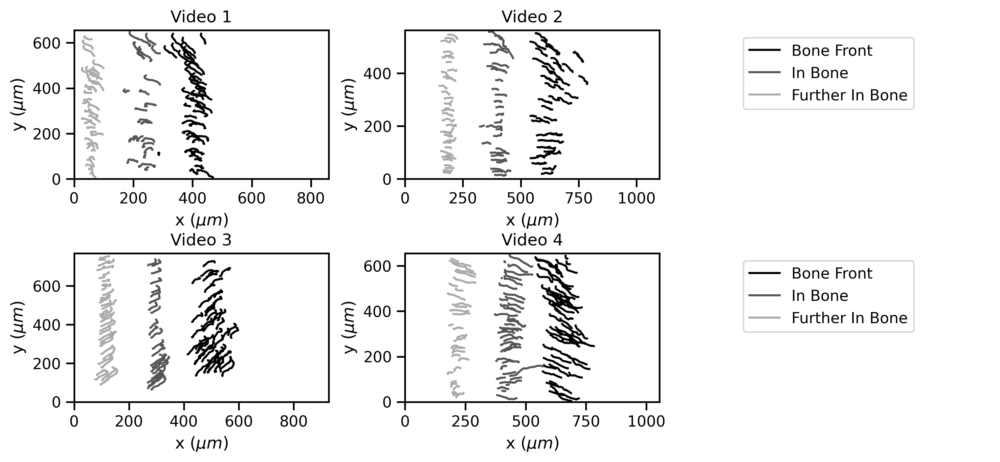

In [8]:
fig, axs = plt.subplots(2, 3, figsize=(12, 5), dpi=300)

for i1 in range(N_videos):
    pix_per_micron = pix_per_micron_all[i1];
    [ix, iy] = divmod(i1, 2);
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2];
        Y_all = Y_all_all[i1][i2];  
        N_cells = N_cells_all[i1][i2];
        
        axs[ix, iy].plot(X_all[:, slice_range].T/pix_per_micron, Y_all[:, slice_range].T/pix_per_micron, color=colors_cats[i2]);
        #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
        #this_title = 'Video {}, {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
        this_title = 'Video {}'.format(i1+1, str(np.sum(N_cells_all[i1])));
        this_size = video_image_sizes[i1];
        axs[ix, iy].set(xlabel='x ($\\mu m$)', ylabel='y ($\\mu m$)', title=this_title, xlim=[0, this_size[0]], ylim=[0, this_size[1]])

plt.subplots_adjust(hspace=0.5, wspace=0.3)
 
# ---- Legend ----
for row in range(2):
    for i, this_label in enumerate(names_compare):
        axs[row, 2].plot(np.nan, label=this_label, color=colors_cats[i])
    axs[row, 2].legend(loc='upper left')
    axs[row, 2].axis('off')
    
# Save figure
fname_out = folder_figures + im_label + "2D_tracks";
label = '_all_videos';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")
    
plt.show()

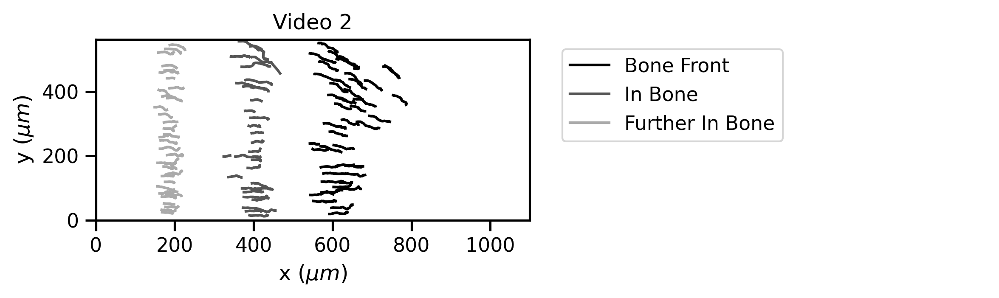

In [9]:
sfactor=1;
fig, axs = plt.subplots(1, 2, figsize=(8*sfactor, 2.5*sfactor), dpi=300)

i1=1; 
for i2 in range(N_files_per_video):
    X_all = X_all_all[i1][i2];
    Y_all = Y_all_all[i1][i2];  
    N_cells = N_cells_all[i1][i2];
    pix_per_micron = pix_per_micron_all[i1];
    
    axs[0].plot(X_all[:, slice_range].T/pix_per_micron, Y_all[:, slice_range].T/pix_per_micron, color=colors_cats[i2]);
    #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
    #this_title = 'Video {}, {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
    this_title = 'Video {}'.format(i1+1);
    this_size = video_image_sizes[i1];
    axs[0].set(xlabel='x ($\\mu m$)', ylabel='y ($\\mu m$)', title=this_title, xlim=[0, this_size[0]], ylim=[0, this_size[1]])

    plt.subplots_adjust(hspace=0.5, wspace=0)

# ---- Legend ----
for i, this_label in enumerate(names_compare):
    axs[1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[1].legend(loc='upper left')
axs[1].axis('off')
plt.tight_layout()
    
# Save figure
fname_out = folder_figures + im_label + "2D_tracks";
label = '_video_2';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")

plt.show()

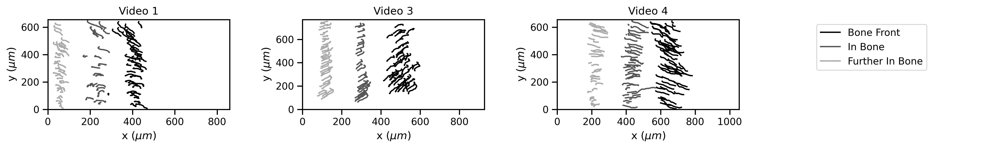

In [10]:
fig, axs = plt.subplots(1, 4, figsize=(16, 2.5), dpi=300)

video_sel = [0, 2, 3];
for i0 in range(len(video_sel)):
    i1 = video_sel[i0];
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2];
        Y_all = Y_all_all[i1][i2];  
        N_cells = N_cells_all[i1][i2];
        
        axs[i0].plot(X_all[:, slice_range].T/pix_per_micron, Y_all[:, slice_range].T/pix_per_micron, color=colors_cats[i2]);
        #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
        #this_title = 'Video {}, {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
        this_title = 'Video {}'.format(i1+1);
        this_size = video_image_sizes[i1];
        axs[i0].set(xlabel='x ($\\mu m$)', ylabel='y ($\\mu m$)', title=this_title, xlim=[0, this_size[0]], ylim=[0, this_size[1]])

        plt.tight_layout()
plt.subplots_adjust(hspace=0.5, wspace=0.4)

# ---- Legend ----
for i, this_label in enumerate(names_compare):
    axs[3].plot(np.nan, label=this_label, color=colors_cats[i])
axs[3].legend(loc='upper left')
axs[3].axis('off')

# Save figure
fname_out = folder_figures + im_label + "2D_tracks";
label = '_videos_1_3_4';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")

plt.show()

## Tracked cells over time
The number of cells which are tracked typically decreases over time, because it is not possible to follow all cells until the end of the video. Hence the averages above are taken over fewer and fewer cells as time progresses, leading to larger uncertainties. Below we plot the number of tracked cells over time for reference.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


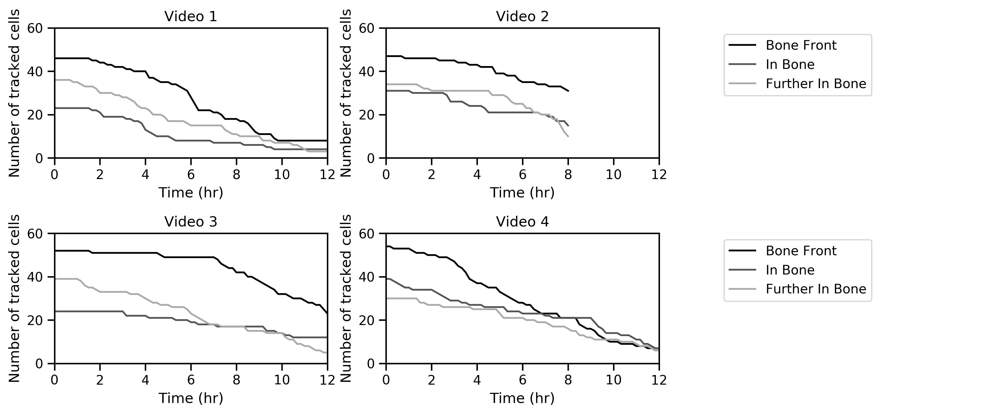

In [12]:
from math import ceil
fig, axs = plt.subplots(2, 3, figsize=(12, 5), dpi=300); #plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=100)

for i1 in range(N_videos):
    [ix, iy] = divmod(i1, 2);
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2];
        slices_all = slices_all_all[i1][i2];
        
        N_tracked_cells_vs_t = np.sum(~np.isnan(X_all), axis=0);        
        
        axs[ix, iy].plot(slices_all[0,:], N_tracked_cells_vs_t, color=colors_cats[i2])
        #this_title = 'Video {} ({}) {}'.format(i1+1, video_labels[i1], names_compare[i2]);
        #this_title = 'Video {}, {}'.format(i1+1, names_compare[i2]);
        this_title = 'Video {}'.format(i1+1);
        # ylim_up = ceil(N_tracked_cells_vs_t[0]/10)*10;
        axs[ix, iy].set(xlabel='Time (hr)', ylabel='Number of tracked cells', title=this_title)
        axs[ix, iy].set(xlim=[t_lower, t_upper], ylim = [0, 60])
        
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.tight_layout()

# ---- Legend ----
for row in range(2):
    for i, this_label in enumerate(names_compare):
        axs[row, 2].plot(np.nan, label=this_label, color=colors_cats[i])
    axs[row, 2].legend(loc='upper left')
    axs[row, 2].axis('off')
    
# Save figure
fname_out = folder_figures + im_label + "tracked_cells_vs_time";
label = '_all_videos_12_hrs';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")    

plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


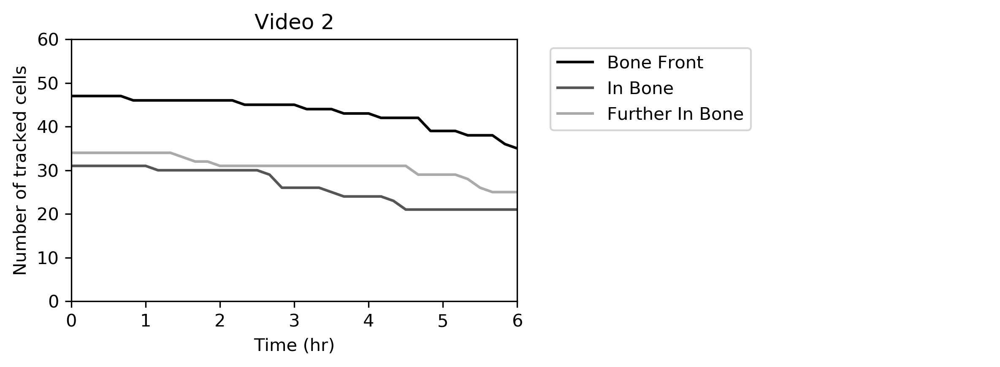

In [12]:
sfactor = 1;
fig, axs = plt.subplots(1, 2, figsize=(8*sfactor, 3*sfactor), dpi=300); #plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=300)

# for i1 in range(N_videos):
#     [ix, iy] = divmod(i1, 2);
i1=1;
for i2 in range(N_files_per_video):
    X_all = X_all_all[i1][i2];
    slices_all = slices_all_all[i1][i2];

    N_tracked_cells_vs_t = np.sum(~np.isnan(X_all), axis=0);        

    axs[0].plot(slices_all[0,:], N_tracked_cells_vs_t, color=colors_cats[i2])
    #this_title = 'Video {} ({}) {}'.format(i1+1, video_labels[i1], names_compare[i2]);
    #this_title = 'Video {}, {}'.format(i1+1, names_compare[i2]);
    this_title = 'Video {}'.format(i1+1)
    # ylim_up = ceil(N_tracked_cells_vs_t[0]/10)*10;
    axs[0].set(xlabel='Time (hr)', ylabel='Number of tracked cells', title=this_title)
    axs[0].set(xlim=[t_lower, t_upper], ylim = [0, 60])
        
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# ---- Legend ----
for i, this_label in enumerate(names_compare):
    axs[1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[1].legend(loc='upper left')
axs[1].axis('off')
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "tracked_cells_vs_time";
label = '_video_2';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")    

plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


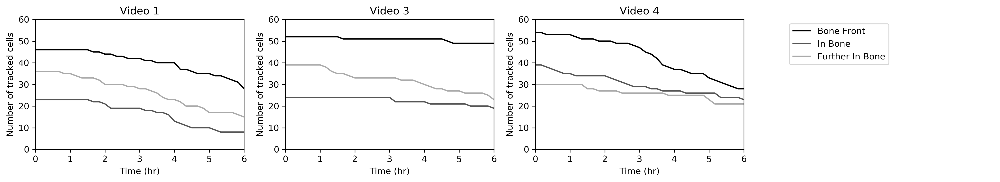

In [13]:
sfactor=1;
fig, axs = plt.subplots(1, 4, figsize=(16*sfactor, 3*sfactor), dpi=300)

video_sel = [0, 2, 3];
for i0 in range(len(video_sel)):
    i1 = video_sel[i0];
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2];
        slices_all = slices_all_all[i1][i2];

        N_tracked_cells_vs_t = np.sum(~np.isnan(X_all), axis=0);        

        axs[i0].plot(slices_all[0,:], N_tracked_cells_vs_t, color=colors_cats[i2])
        #this_title = 'Video {} ({}) {}'.format(i1+1, video_labels[i1], names_compare[i2]);
        #this_title = 'Video {}, {}'.format(i1+1, names_compare[i2]);
        this_title = 'Video {}'.format(i1+1);
        # ylim_up = ceil(N_tracked_cells_vs_t[0]/10)*10;
        axs[i0].set(xlabel='Time (hr)', ylabel='Number of tracked cells', title=this_title)
        axs[i0].set(xlim=[t_lower, t_upper], ylim = [0, 60])
        
plt.subplots_adjust(hspace=0.5, wspace=0.4)

# ---- Legend ----
for i, this_label in enumerate(names_compare):
    axs[3].plot(np.nan, label=this_label, color=colors_cats[i])
axs[3].legend(loc='upper left')
axs[3].axis('off')
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "tracked_cells_vs_time";
label = '_videos_1_3_4';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")

plt.show()

# Cell velocities

In [40]:
X_all = X_all_all[0][1][:,slice_range]
X_all[:, 0]

array([ 979., 1052., 1063., 1042., 1024.,  953., 1081., 1014.,  972.,
       1080.,  991., 1066.,  989.,  973., 1175.,  904., 1077.,  826.,
        886.,  801.,  835.,  920.,  751.])

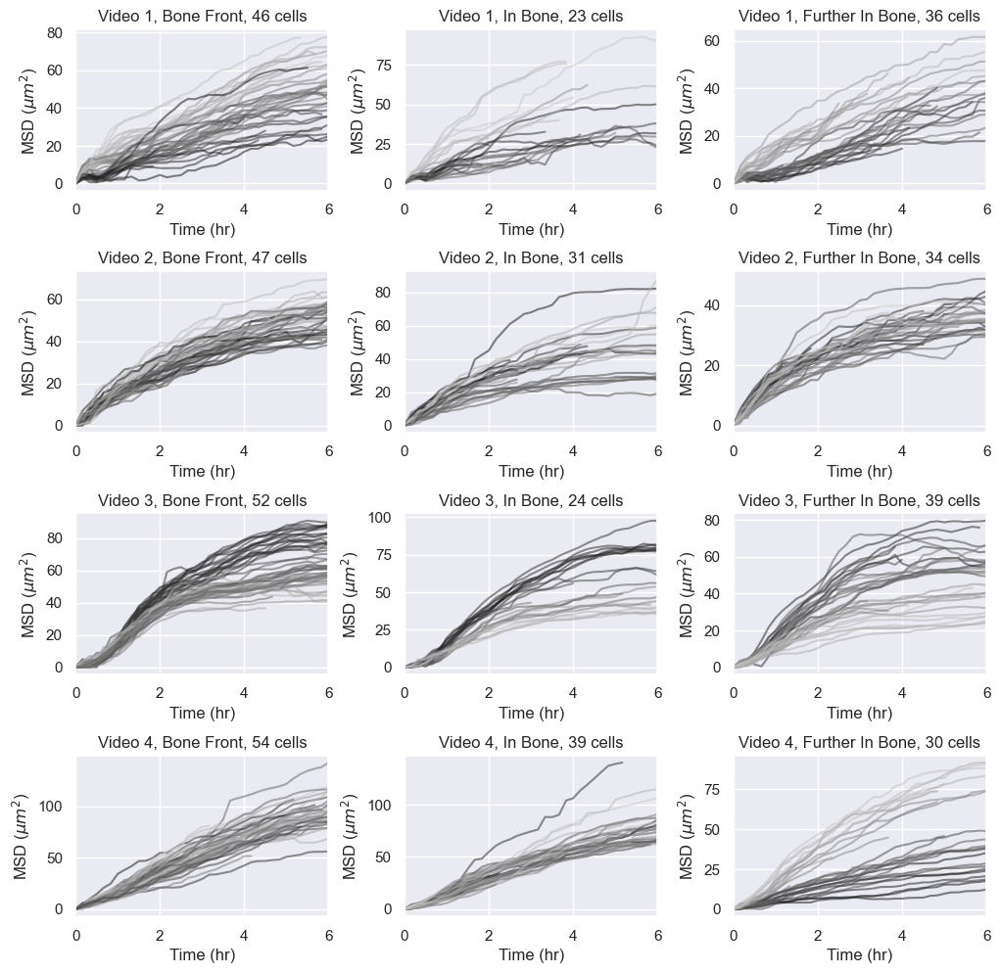

Lighter colors = higher Y values


In [29]:
# Plot displacements in vs t

# Calculate RMSD for all cells
v_time_ranges = np.array([[0, 4]]); #, [0, 6]]); # in hours
RSMD_df = pd.DataFrame([], columns=["Video", "Location", "Time1", "Time2", "X0", "Y0", "Velocity"])

counter = 0; # for adding elements to df
fig, axs = plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=100)
for i1 in range(N_videos):
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2][:,slice_range];
        Y_all = Y_all_all[i1][i2][:,slice_range];
        N_cells = N_cells_all[i1][i2];
        slices_all = slices_all_all[i1][i2][:, slice_range];
        X0_all = X_all[:, 0]/pix_per_micron;
        Y0_all = Y_all[:, 0]/pix_per_micron; #/video_image_sizes_pix[i1][1];
        Y0_rescaled_all = Y_all[:, 0]/video_image_sizes_pix[i1][1];
        
        RMSD_all = np.array(list(map( lambda X, Y: np.sqrt( (X-X[0])**2 + (Y-Y[0])**2), X_all, Y_all)))/pix_per_micron; # units: microns^2
        
        # Calculate velocities over specified time ranges
        for i3 in range(len(v_time_ranges)):
            time_range = np.round(6*v_time_ranges[i3]);
            v_cells_all = (RMSD_all[:, int(time_range[1])] - RMSD_all[:, int(time_range[0])])/(np.diff(time_range/6)[0]);
            cells_slice = ~np.isnan(v_cells_all);
            v_cells = v_cells_all[cells_slice];
            X0_cells = X0_all[cells_slice];
            Y0_cells = Y0_all[cells_slice];
            
            for i4 in range(len(v_cells)):
                #RSMD_df.loc[counter] = [i1+1, names_compare[i2], time_range[0], time_range[1], Y0_cells[i4], v_cells[i4]]
                RSMD_df.loc[counter] = [i1+1, names_compare[i2], time_range[0], time_range[1], 
                                        X0_cells[i4], Y0_cells[i4], v_cells[i4]]
                counter += 1;
        
        # -- Plot everything with same or default colors --
        #axs[i1, i2].plot(slices_all.T, RMSD_all.T)
        
        # -- Plot with colors depending on initial Y position -- 
        for j in range(slices_all.shape[0]):
            this_color = 0.8*np.ones(3)*Y0_rescaled_all[j];
            axs[i1, i2].plot(slices_all[0], RMSD_all[j, :], color=this_color, alpha=0.5);
        
        #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
        this_title = 'Video {}, {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
        axs[i1, i2].set(xlabel='Time (hr)', ylabel='MSD ($\\mu m^2$)', title=this_title, xlim=[t_lower, t_upper])

plt.subplots_adjust(hspace=0.5, wspace=0.3)

plt.show()

print("Lighter colors = higher Y values")

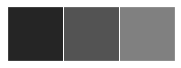

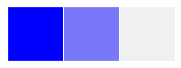

In [24]:
# Choose color palette
# pal = sns.cubehelix_palette(3, start=1.5, rot=-.75);
pal = sns.dark_palette('gray', n_colors=3, reverse=False)
pal2 = sns.light_palette('blue', n_colors=3, reverse=True);
sns.palplot(pal)
sns.palplot(pal2)

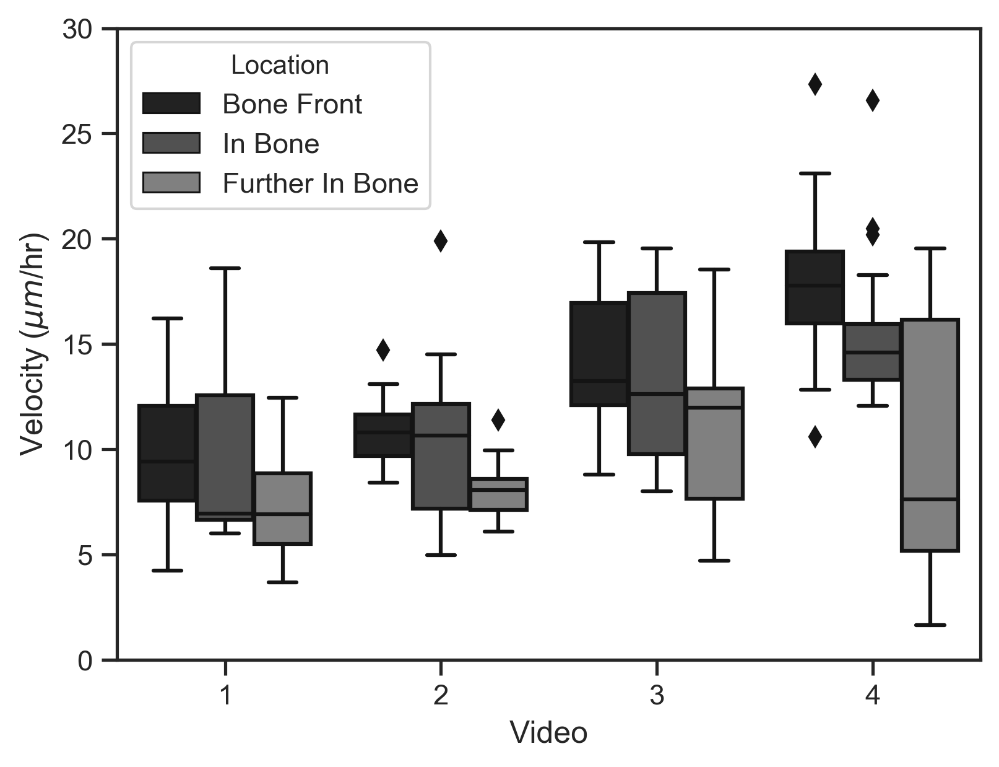

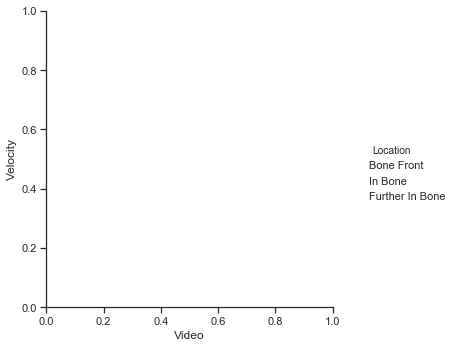

In [13]:
# Select data
k=0;
time_range = v_time_ranges[k]
slice_bool = (RSMD_df.Time1 == np.round(time_range[0]*6) ) & (RSMD_df.Time2 == np.round(time_range[1]*6) )
RSMD_df_sel = RSMD_df[slice_bool];

# Plot options
plt.ioff()
sns.set(font_scale=1, style="ticks")

# Default seaborn plotting 
fig, ax = plt.subplots(figsize=(4*1.5,3*1.5), dpi=300)
# scatter plot 
#g = sns.catplot(x="Video", y="Velocity", hue='Location', kind='swarm', data=RSMD_df_sel, palette=pal, ax=ax)
# box plot
g = sns.catplot(x="Video", y="Velocity", kind="box", hue='Location', data=RSMD_df_sel, palette=pal, ax=ax )
ax.set_ylabel('Velocity ($\mu m$/hr)')
ax.set_ylim([0, 30])

# Plot data
# fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(4*2, 3*2), dpi=300)
# plt.subplots_adjust(hspace=0.4, wspace=0.3)
# for ix in range(2):
#     for iy in range(2):
#         i = 2*(ix) + (iy); 
#         this_data = RSMD_df_sel[RSMD_df_sel['Video'] == i+1];
        
#         # scatter / swarm
#         g = sns.catplot(x="Location", y="Velocity", data=this_data, palette=pal, ax=ax[ix, iy])
        
#         # box plot
#         #g = sns.catplot(x="Location", y="Velocity", kind="box", data=this_data, palette=pal, ax=ax[ix, iy])
        
#         # set labels
#         ax[ix,iy].set_ylabel('Velocity ($\mu m$/hr)')
#         ax[ix,iy].set_ylim([0, 25])
#         ax[ix,iy].set_title('Video {}'.format(i+1) )
        
# Save figure
fname_out = folder_figures + im_label + "cell_velocities_time_range_{}_to_{}_hrs".format(time_range[0], time_range[1]);
#label = '_all_videos_swarm';
label = '_all_videos_box';
extra = '_all_def_colors'
# fig.savefig(fname_out + label + extra + ".pdf")
# fig.savefig(fname_out + label + extra + ".eps")

# restore defaults
plt.ion()
sns.set(font_scale=1)


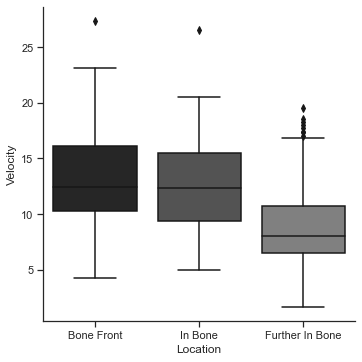

In [25]:
# Plot everything together in one box plot, sort by location
# Select data
k=0;
time_range = v_time_ranges[k]
slice_bool = (RSMD_df.Time1 == np.round(time_range[0]*6) ) & (RSMD_df.Time2 == np.round(time_range[1]*6) )
RSMD_df_sel = RSMD_df[slice_bool];

# Plot options
plt.ioff()
sns.set(font_scale=1, style="ticks")

# Default seaborn plotting
# fig, ax = plt.subplots(figsize=(3*1.5,3*1.5), dpi=300)
# scatter plot 
#g = sns.catplot(x="Video", y="Velocity", hue='Location', kind='swarm', data=RSMD_df_sel, palette=pal, ax=ax)

# box plot
g = sns.catplot(x="Location", y="Velocity", kind="box", data=RSMD_df_sel, palette=pal, ax=ax )
ax.set_ylabel('Velocity ($\mu m$/hr)')
ax.set_ylim([0, 30])

# Save figure
fname_out = folder_figures + im_label + "cell_velocities";
label = '_all_videos_merged_sort_by_location_gray_size_3_3';
# fig.savefig(fname_out + label + ".pdf")
# fig.savefig(fname_out + label + ".eps")    

# restore defaults
plt.ion()
sns.set(font_scale=1)

In [40]:
# Values
v_BF = RSMD_df_sel[RSMD_df_sel["Location"]=="Bone Front"]["Velocity"]
v_IB = RSMD_df_sel[RSMD_df_sel["Location"]=="In Bone"]["Velocity"]
v_FIB = RSMD_df_sel[RSMD_df_sel["Location"]=="Further In Bone"]["Velocity"]

values = pd.DataFrame(columns=["Location", "Mean", "Standard Deviation"])
values.loc[0] = [names_compare[0], np.mean(v_BF), np.std(v_BF)]
values.loc[1] = [names_compare[1], np.mean(v_IB), np.std(v_IB)]
values.loc[2] = [names_compare[2], np.mean(v_FIB), np.std(v_FIB)]
# print( np.mean(v_BF), np.std(v_BF) )
# print( np.mean(v_IB), np.std(v_IB) )
# print( np.mean(v_FIB), np.std(v_FIB) )
values

,Location,Mean,Standard Deviation
0,Bone Front,13.168859,4.082837
1,In Bone,12.565226,4.262766
2,Further In Bone,9.076710,3.909532


In [26]:
RSMD_df_sel

,Video,Location,Time1,Time2,X0,Y0,Velocity
0,1,Bone Front,0,24,398.181818,40.000000,4.220256
1,1,Bone Front,0,24,413.409091,58.636364,4.815823
2,1,Bone Front,0,24,399.090909,102.500000,5.138827
3,1,Bone Front,0,24,401.590909,115.227273,7.274725
4,1,Bone Front,0,24,379.545455,120.227273,4.959157
...,...,...,...,...,...,...,...
361,4,Further In Bone,0,24,202.797838,548.212745,17.738497
362,4,Further In Bone,0,24,209.610755,577.508289,17.021881
363,4,Further In Bone,0,24,215.969478,583.867012,17.336257
364,4,Further In Bone,0,24,196.893310,614.070945,18.320165


In [28]:
# export data
folder_out = '/Users/dang/Documents/Projects/Tabler_skull/Data_Adrian_cell_tracks/Analyzed_data/'
filename_out = 'Velocities_all_videos.csv'
RSMD_df_sel.to_csv(folder_out + filename_out)


# Mean-squared displacements
The mean-squared displacement of the cells in 2D is given by MSD(t) = $\langle [x(t) - x(0)]^2 + [y(t) - y(0)]^2 \rangle$.

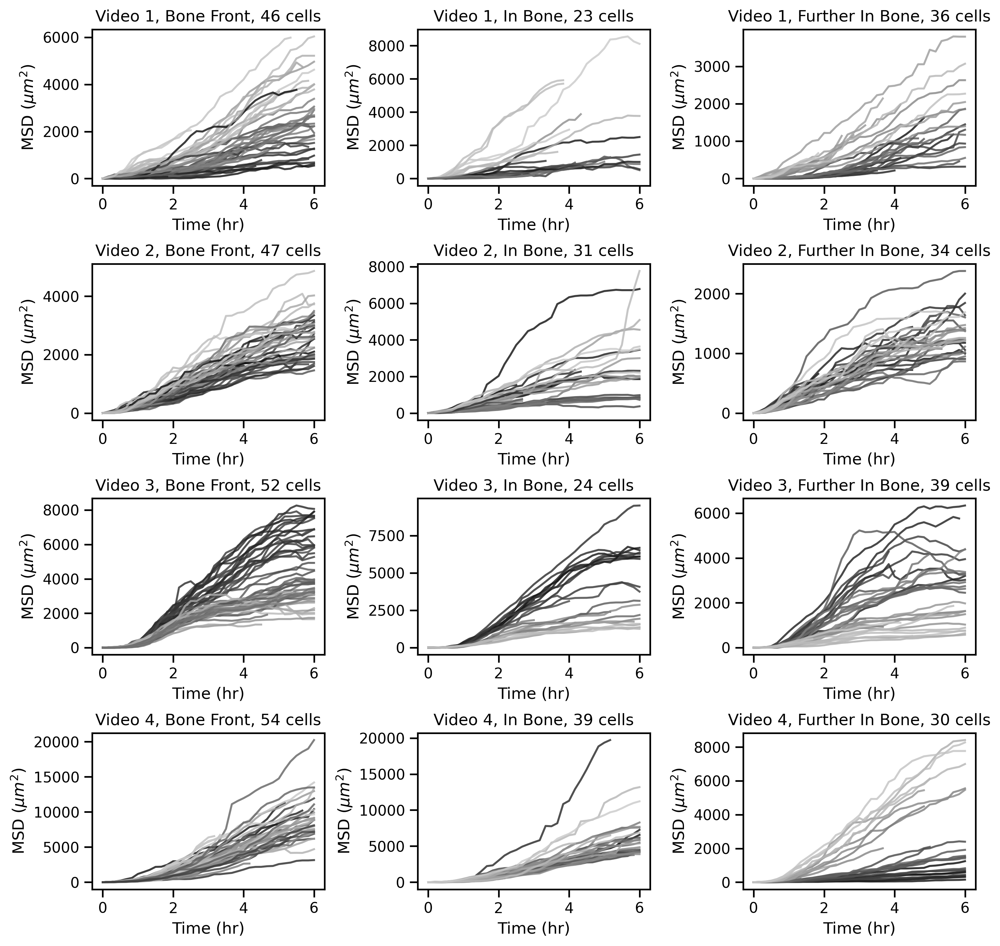

In [8]:
# Plot MSD vs t
fig, axs = plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=300)
for i1 in range(N_videos):
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2][:,slice_range];
        Y_all = Y_all_all[i1][i2][:,slice_range];
        N_cells = N_cells_all[i1][i2];
        slices_all = slices_all_all[i1][i2][:, slice_range];
        
        Y0_rescaled_all = Y_all[:, 0]/video_image_sizes_pix[i1][1];
        
        MSD_all = np.array(list(map( lambda X, Y: (X-X[0])**2 + (Y-Y[0])**2 , X_all, Y_all)))/pix_per_micron**2; # units: microns^2
        
        #X0 = X_all[0]
        #Y0 = Y_all[0]
        #MSD_all = np.array(list(map( lambda X, Y: (X-X_all[0])**2 + (Y-Y_all[0])**2 , X_all, Y_all)))/pix_per_micron**2; # units: microns^2
       
        # -- Plot everything with same or default colors --
        #axs[i1, i2].plot(slices_all.T, MSD_all.T)
        
        # -- Plot with colors depending on initial Y position -- 
        for i3 in range(slices_all.shape[0]):
            this_color = 0.8*np.ones(3)*Y0_rescaled_all[i3];
            axs[i1, i2].plot(slices_all[0], MSD_all[i3, :], color=this_color, alpha=0.8);
        
        # set figure properties
        #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
        this_title = 'Video {}, {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
        axs[i1, i2].set(xlabel='Time (hr)', ylabel='MSD ($\\mu m^2$)', title=this_title);
        #axs[i1, i2].text(0.5, 4.5*10**4, this_title) # manual title
        #axs[i1, i2].set(xlim=[t_lower, t_upper], ylim=[0, 15000]);
        #axs[i1, i2].ticklabel_format(style='sci', axis='y', scilimits=(0,0)) # set to scientific notation

plt.subplots_adjust(hspace=0.5, wspace=0.4)

# Save figure
fname_out = folder_figures + im_label + "tracked_cells_vs_time";
label = '_all_videos_gray';
#plt.savefig(fname_out + label + ".pdf")
#plt.savefig(fname_out + label + ".eps")    

plt.show()

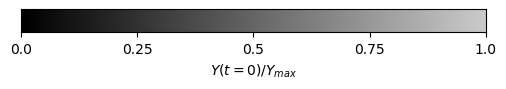

In [86]:
#manually make colorbar
max_gray = 0.8;
y_size = 5;
x_all = np.arange(0,1,0.01);
colors_all = np.array([[max_gray*np.array([1,1,1])*f for f in x_all] for _ in range(y_size) ]);
plt.figure(dpi=100)
plt.imshow(colors_all)
plt.xlabel('$Y(t=0)/Y_{max}$')
xtick_vals = np.linspace(0, len(x_all), 5);
plt.xticks( xtick_vals )
x_tick_labels = [ str(xtick_vals[i]/len(x_all)) for i in range(len(xtick_vals))];
plt.xticks(ticks=xtick_vals-0.5, labels=x_tick_labels)
plt.xlim([-0.5,len(x_all)-0.5])
plt.yticks([])

# Save figure
fname_out = folder_figures + im_label + "tracked_cells_vs_time";
label = '_colorbar';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")

plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

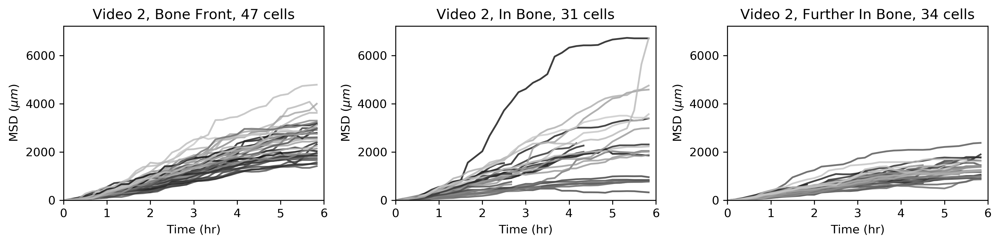

In [83]:
# Plot displacements in horizontal direction vs t
fig, axs = plt.subplots(1, N_files_per_video, figsize=(12, 3), dpi=300)
i1=1;
pix_per_micron = pix_per_micron_all[i1];
for i2 in range(N_files_per_video):
    X_all = X_all_all[i1][i2][:,slice_range];
    Y_all = Y_all_all[i1][i2][:,slice_range];
    N_cells = N_cells_all[i1][i2];
    slices_all = slices_all_all[i1][i2][:, slice_range];
    
    Y0_rescaled_all = Y_all[:, 0]/video_image_sizes_pix[i1][1];

    MSD_all = np.array(list(map( lambda X, Y: (X-X[0])**2 + (Y-Y[0])**2 , X_all, Y_all)))/pix_per_micron**2; # units: microns^2

    # -- Plot everything with same or default colors --
    #axs[i1, i2].plot(slices_all.T, MSD_all.T)

    # -- Plot with colors depending on initial Y position -- 
    for i3 in range(slices_all.shape[0]):
        this_color = 0.8*np.ones(3)*Y0_rescaled_all[i3];
        axs[i2].plot(slices_all[0], MSD_all[i3, :], color=this_color, alpha=0.8);
            
    #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
    this_title = 'Video {}, {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
    axs[i2].set(xlabel='Time (hr)', ylabel='MSD ($\\mu m$)', title=this_title, xlim=[t_lower, t_upper])
    axs[i2].set(ylim = (-2, 85**2));

plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "tracked_cells_vs_time";
label = '_video_2_gray';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")    

plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

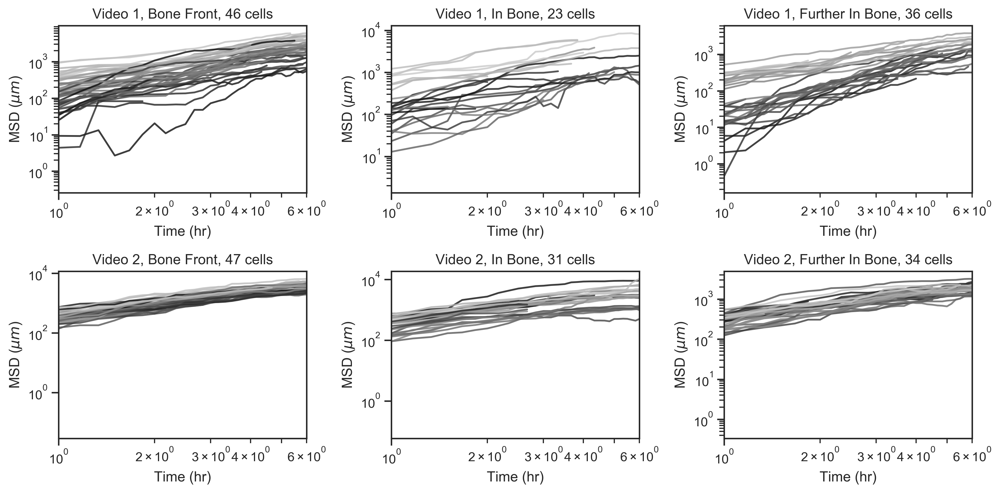

In [238]:
# Plot displacements in horizontal direction vs t

video_sel = [0, 1];
fig, axs = plt.subplots(len(video_sel), N_files_per_video, figsize=(4*N_files_per_video, 3*len(video_sel)), dpi=300)

for i0 in range(len(video_sel)):
    i1 = video_sel[i0];
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2][:,slice_range];
        Y_all = Y_all_all[i1][i2][:,slice_range];
        N_cells = N_cells_all[i1][i2];
        slices_all = slices_all_all[i1][i2][:, slice_range];
        
        Y0_rescaled_all = Y_all[:, 0]/video_image_sizes_pix[i1][1];

        MSD_all = np.array(list(map( lambda X, Y: (X-X[0])**2 + (Y-Y[0])**2 , X_all, Y_all)))/pix_per_micron**2; # units: microns^2

        # -- Plot everything with same or default colors --
        #axs[i0, i2].plot(slices_all.T, MSD_all.T)

        # -- Plot with colors depending on initial Y position -- 
        for i3 in range(slices_all.shape[0]):
            this_color = 0.8*np.ones(3)*Y0_rescaled_all[i3];
            axs[i0,i2].plot(slices_all[0], MSD_all[i3, :], color=this_color, alpha=0.8);
            
        #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
        this_title = 'Video {}, {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
        axs[i0, i2].set(xlabel='Time (hr)', ylabel='MSD ($\\mu m$)', title=this_title, xlim=[t_lower, t_upper])
        axs[i0, i2].set(xscale='log', yscale='log', xlim=[1, t_upper])

plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "tracked_cells_vs_time";
label = '_videos_1_2_gray';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")    

plt.show()

### Average over cells

Blue shaded area = standard error of the mean
Grey shaded area = standard deviation of data set


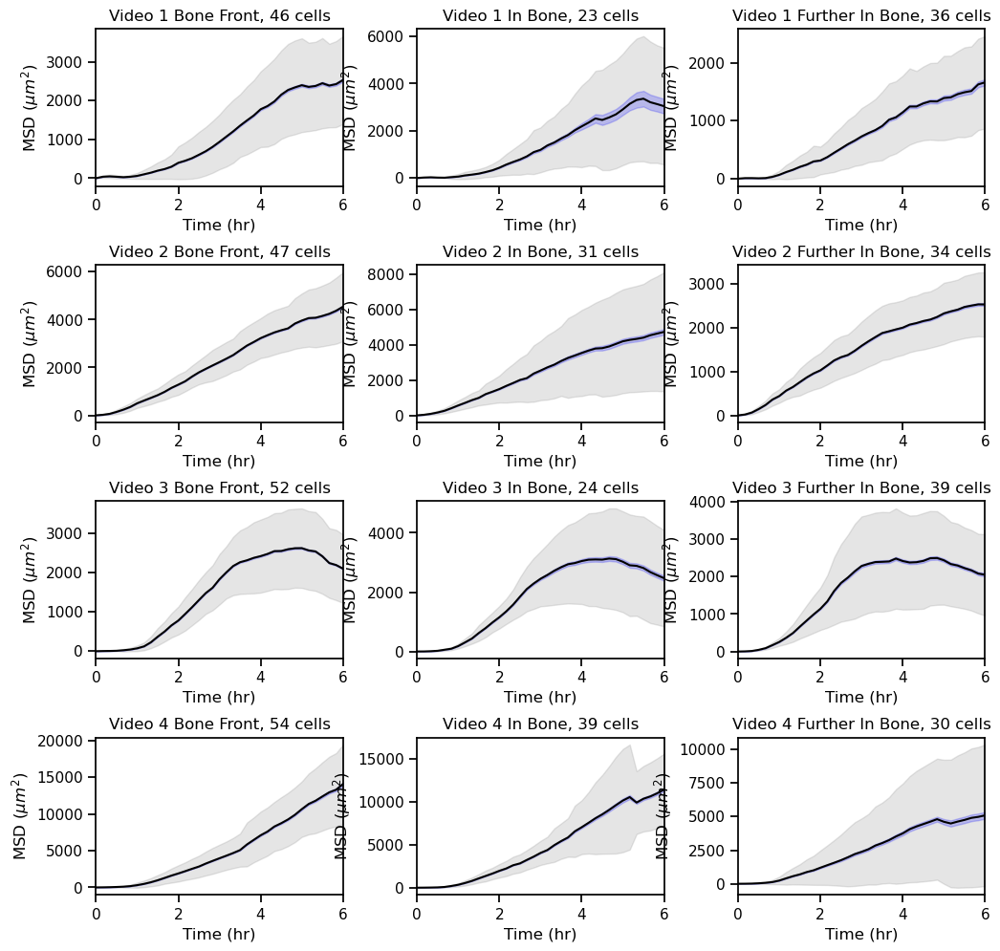

In [12]:
# --- Average over all cells ---
# store for later
MSD_avg_all = [[None]*N_files_per_video for _ in range(N_videos)];
sem_all_all = [[None]*N_files_per_video for _ in range(N_videos)];

# Plot displacements in horizontal direction vs t
fig, axs = plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=100)
for i1 in range(N_videos):
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2][:, slice_range];
        Y_all = X_all_all[i1][i2][:, slice_range];
        N_cells = N_cells_all[i1][i2];
        slices = slices_all_all[i1][i2][0, slice_range];
        
        # Compute mean
        MSD_all = np.array(list(map( lambda X, Y: (X-X[0])**2 + (Y-Y[0])**2 , X_all, Y_all)))/pix_per_micron**2; # units: microns
        MSD_avg = np.nanmean(MSD_all, axis=0);
        
        # Compute SEM
        std_all = np.nanstd(MSD_all, axis=0); # Std for each time point
        n_all = np.sum(~np.isnan(MSD_all), axis=0); # no. data points per time point
        sem_all = std_all/n_all;
        
        # store results
        MSD_avg_all[i1][i2] = MSD_avg;
        sem_all_all[i1][i2] = sem_all;
        
        axs[i1, i2].plot(slices, MSD_avg, color='k')
        axs[i1, i2].fill_between(slices, MSD_avg+std_all, MSD_avg-std_all, alpha=0.2, color='gray')
        axs[i1, i2].fill_between(slices, MSD_avg+sem_all, MSD_avg-sem_all, alpha=0.2, color='b')
        #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
        this_title = 'Video {} {}, {} cells'.format(i1+1, names_compare[i2], str(N_cells));
        axs[i1, i2].set(xlabel='Time (hr)', ylabel='MSD ($\\mu m^2$)', title=this_title, xlim=[t_lower, t_upper])

plt.subplots_adjust(hspace=0.5, wspace=0.3)

# print("Net mean velocity over {} hours = {} microns/hr".format(t_upper, round(X_displacements_avg[-1]/t_upper)) )
print("Blue shaded area = standard error of the mean")
print("Grey shaded area = standard deviation of data set")

plt.show()

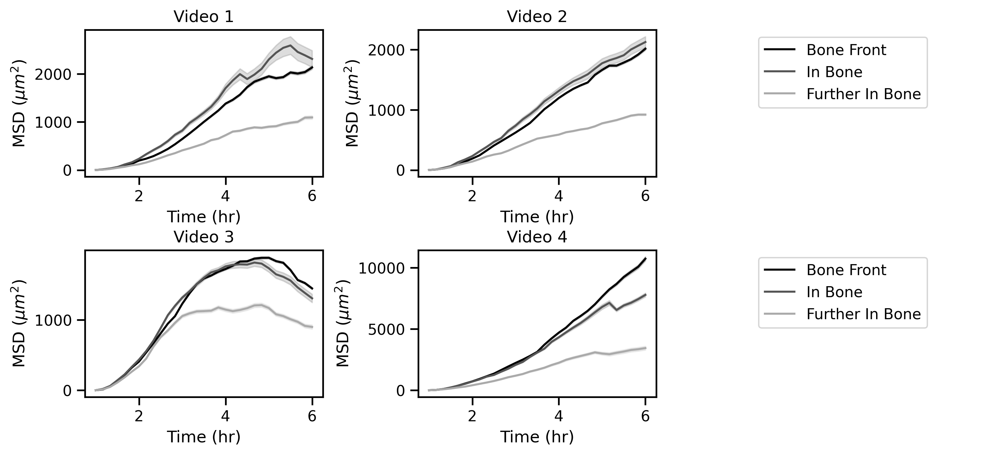

In [39]:
# --- Same data as previous plots, but now directly compare bone front and in bone ---
fig, axs = plt.subplots(2, 3, figsize=(12, 5), dpi=300);
for i1 in range(N_videos):
    [ix, iy] = divmod(i1, 2); # positions of plots
    for i2 in range(N_files_per_video):
        slices = slices_all_all[i1][i2][0, slice_range];        
        axs[ix, iy].plot(slices, MSD_avg_all[i1][i2], label=names_compare[i2], color=colors_cats[i2]) # def_colors / colors_cats
        axs[ix, iy].fill_between(slices, MSD_avg_all[i1][i2]+sem_all_all[i1][i2], MSD_avg_all[i1][i2]-sem_all_all[i1][i2], alpha=0.2, color=colors_cats[i2])
        # def_colors
    #axs[i1].set( title= 'Video {} ({})'.format(i1+1, video_labels[i1]), xlabel='Time (hr)', ylabel='$\\langle x(t) - x(0) \\rangle$ ($\\mu m$)'  )
    axs[ix, iy].set( title= 'Video {}'.format(i1+1), xlabel='Time (hr)', ylabel='MSD ($\\mu m^2$)'  )
    #axs[i1].legend();
plt.subplots_adjust(wspace=0.4, hspace=0.5)

# ---- Legend ----
#plt.figure(dpi=100, figsize = (2, 1) )
for row in range(2):
    for i, this_label in enumerate(names_compare):
        axs[row, 2].plot(np.nan, label=this_label, color=colors_cats[i])
    axs[row, 2].legend(loc='upper left')
    axs[row, 2].axis('off');

# save figure
fname_out = folder_figures + im_label + "MSD_average_shaded_SEM";
label = '_all_videos_gray';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")    

plt.show()

Compare with Furth's formula (OU process): $MSD(t) = 2nD(t - P (1 - e^{-t/P}) ) $. <br>
D: diffusion constant <br>
P: persistence time <br>
n: spatial dimension <br>
Small times ($t \ll P$): $\propto t^2$ <br>
Large times ($t \ll P$): $\propto t$

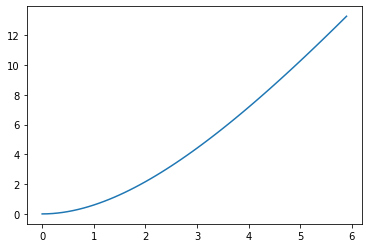

In [58]:
t_all = np.arange(0, 6, 0.1)
n = 2;
D = 1;
P = 3;
y_all = 2*n*D*(t_all - P*(1-np.exp(-t_all/P)) )
plt.plot(t_all, y_all)
# plt.xscale('log')
# plt.yscale('log')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

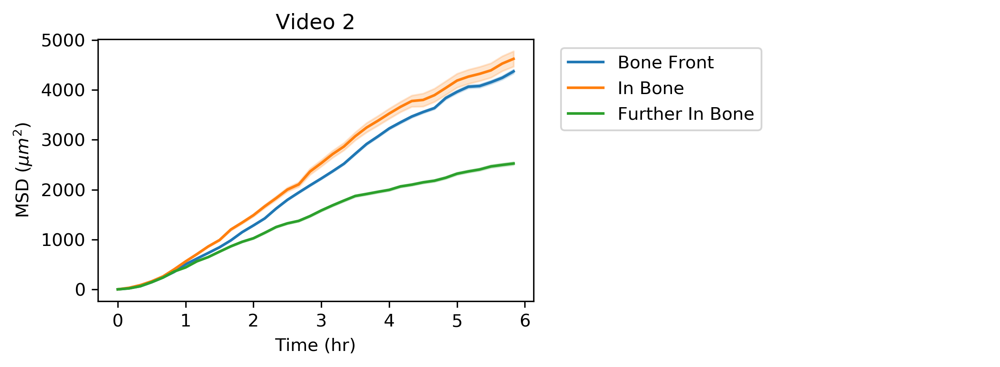

In [50]:
# --- Same data as previous plots, but now directly compare bone front and in bone ---
fig, axs = plt.subplots(1, 2, figsize=(8, 3), dpi=300);
i1=1;
for i2 in range(N_files_per_video):
    slices = slices_all_all[i1][i2][0, slice_range];

    axs[0].plot(slices, MSD_avg_all[i1][i2], label=names_compare[i2], color=def_colors[i2]) # def_colors / colors_cats
    axs[0].fill_between(slices, MSD_avg_all[i1][i2]+sem_all_all[i1][i2], MSD_avg_all[i1][i2]-sem_all_all[i1][i2], alpha=0.2, color=def_colors[i2])

#axs[i1].set( title= 'Video {} ({})'.format(i1+1, video_labels[i1]), xlabel='Time (hr)', ylabel='$\\langle x(t) - x(0) \\rangle$ ($\\mu m$)'  )
axs[0].set( title= 'Video {}'.format(i1+1), xlabel='Time (hr)', ylabel='MSD ($\\mu m^2$)'  )
#axs[i1].legend();
plt.subplots_adjust(wspace=0.3, hspace=0.5)

# ---- Legend ----
#plt.figure(dpi=100, figsize = (2, 1) )
for i, this_label in enumerate(names_compare):
    axs[1].plot(np.nan, label=this_label, color=def_colors[i])
axs[1].legend(loc='upper left')
axs[1].axis('off')
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "MSD_average_shaded_SEM";
label = '_video_2';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")    

plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

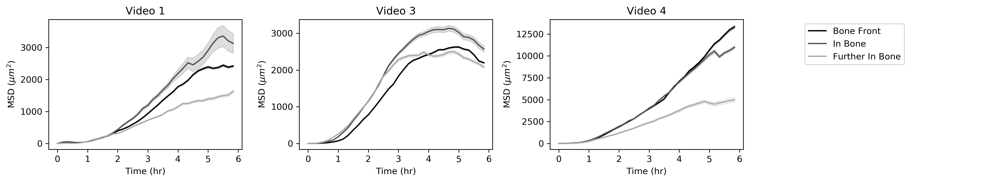

In [53]:
# Plot displacements in horizontal direction vs t
fig, axs = plt.subplots(1, N_files_per_video+1, figsize=(16, 3), dpi=300)
i1=1;
pix_per_micron = pix_per_micron_all[i1];
video_sel = [0, 2, 3];
for i0 in range(len(video_sel)):
    i1 = video_sel[i0];
    for i2 in range(N_files_per_video):
        slices = slices_all_all[i1][i2][0, slice_range];

        axs[i0].plot(slices, MSD_avg_all[i1][i2], label=names_compare[i2], color=colors_cats[i2]); # def_colors /colors_cats
        axs[i0].fill_between(slices, MSD_avg_all[i1][i2]+sem_all_all[i1][i2], MSD_avg_all[i1][i2]-sem_all_all[i1][i2], alpha=0.2, color=colors_cats[i2])
    axs[i0].set( title= 'Video {}'.format(i1+1), xlabel='Time (hr)', ylabel='MSD ($\\mu m^2$)'  )

#plt.figure(dpi=100, figsize = (2, 1) )
for i, this_label in enumerate(names_compare):
    axs[i0+1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[i0+1].legend(loc='upper left')
axs[i0+1].axis('off')
     
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "MSD_average_shaded_SEM";
label = '_videos_1_3_4_gray';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")    

plt.show()

#### Average over experiments

In [9]:
slice_range

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36])

In [21]:
plot_range =[6,36]

In [24]:
slices = slices_all_all[0][0][0, :];
t_plot = slices[plot_range[0]:plot_range[1]]
t_plot

array([1.        , 1.16666667, 1.33333333, 1.5       , 1.66666667,
       1.83333333, 2.        , 2.16666667, 2.33333333, 2.5       ,
       2.66666667, 2.83333333, 3.        , 3.16666667, 3.33333333,
       3.5       , 3.66666667, 3.83333333, 4.        , 4.16666667,
       4.33333333, 4.5       , 4.66666667, 4.83333333, 5.        ,
       5.16666667, 5.33333333, 5.5       , 5.66666667, 5.83333333])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

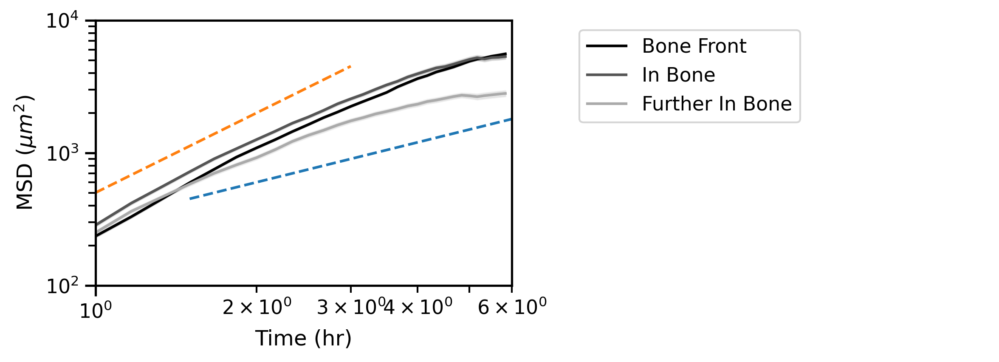

In [27]:
# Plot displacements in horizontal direction vs t
fig, axs = plt.subplots(1, 2, figsize=(8, 3), dpi=300)

pix_per_micron = pix_per_micron_all[i1];
slices = slices_all_all[0][0][0, :];
t_plot = slices[plot_range[0]:plot_range[1]]


for i2 in range(N_files_per_video):
    MSD_avg_all_all = np.mean( np.array(MSD_avg_all)[:, i2], axis=0 ) # works only if MSD_avg_all has regular sizes!
    sem_all_all_all = np.sqrt( np.sum( np.array(sem_all_all)[:, i2]**2, axis=0 )/N_videos );
    
    MSD_avg_plot = MSD_avg_all_all[plot_range[0]:plot_range[1]]
    sem_plot = sem_all_all_all[plot_range[0]:plot_range[1]]
    axs[0].plot(t_plot, MSD_avg_plot, label=names_compare[i2], color=colors_cats[i2]); # def_colors / colors_cats
    axs[0].fill_between(t_plot, MSD_avg_plot-sem_plot, MSD_avg_plot+sem_plot, alpha=0.2, color=colors_cats[i2])

    #MSD_avg_all_all = np.mean( np.array(MSD_avg_all)[:, i2], axis=0 ) # works only if MSD_avg_all has regular sizes!
    #sem_all_all_all = np.sqrt( np.sum( np.array(sem_all_all)[:, i2]**2, axis=0 )/N_videos );
    #axs[0].plot(slices, MSD_avg_all_all, label=names_compare[i2], color=colors_cats[i2]); # def_colors / colors_cats
    #axs[0].fill_between(slices, MSD_avg_all_all-sem_all_all_all, MSD_avg_all_all+sem_all_all_all, alpha=0.2, color=colors_cats[i2])
axs[0].set( xlabel='Time (hr)', ylabel='MSD ($\\mu m^2$)'  )
axs[0].set_xlim(1, 6)
axs[0].set_ylim(10**2, 10**4)
axs[0].set_xscale('log')
axs[0].set_yscale('log')

# Plot t^2 and t scaling for ref
t1_all = np.linspace(1.5, 6, 30)
t2_all = np.linspace(1, 3, 30)
ref1 = 300*t1_all;
ref2 = 500*t2_all**2;
# t1_all = np.linspace(3, 6, 30)
# t2_all = np.linspace(1, 3, 30)
# ref1 = 450*t1_all;
# ref2 = 150*t2_all**2;
axs[0].plot(t1_all, ref1, '--')
axs[0].plot(t2_all, ref2, '--')

#plt.figure(dpi=100, figsize = (2, 1) )
for i, this_label in enumerate(names_compare):
    axs[1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[1].legend(loc='upper left')
axs[1].axis('off')
     
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.tight_layout()

# # Save figure
fname_out = folder_figures + im_label + "MSD_average_shaded_SEM";
label = '_all_videos_averaged_gray_log_log';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")    

plt.show()

#### Average cell velocities

In [141]:
t_lims = np.array([0, 4*6]);
avg_velocities = np.zeros([N_videos, N_files_per_video]);

# calculate velocities
avg_velocities = np.array([ [ (np.diff(np.sqrt(MSD_avg_all[i1][i2][t_lims]))/np.diff(t_lims/6)).flat[0]  for i2 in range(N_files_per_video)] for i1 in range(N_videos)])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


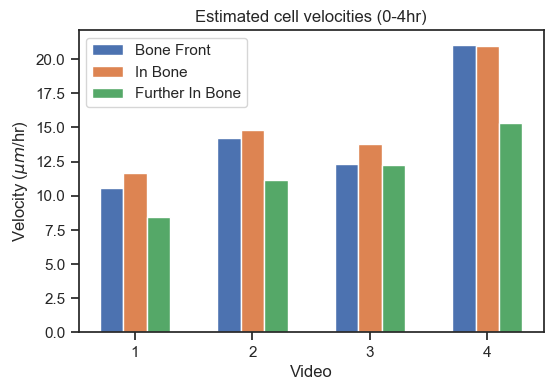

In [142]:
# plot results
width = 0.2;  # the width of the bars

x = np.arange(N_videos) - (N_files_per_video-1)*width/2 + 1;  # the label locations

plt.figure(dpi=100);
for i2 in range(N_files_per_video):
    plt.bar(x + i2*width*(N_files_per_video-1)/2, avg_velocities[:, i2], width, label=names_compare[i2])
plt.legend();
plt.xticks(np.arange(N_videos)+1)
plt.xlabel('Video')
plt.ylabel('Velocity ($\mu m$/hr)')
plt.title('Estimated cell velocities (0-4hr)')

# Save figure
fname_out = folder_figures + im_label + "RMSD_average_velocities_t_{}_to_{}".format(t_lims[0], t_lims[1]);
label = '_all_videos';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")    

plt.show();

# (2) Persistence of cell motion

Do cells in the front move more persistently (i.e. along the same direction) than cells in the bulk?

### Approach 1: "Fraction of efficient movement"
Define persistence as the ratio between the net displacement (i.e. distance between initial and final position of a cell) and the total displacement (i.e. total length of path travelled). 
This is related to but different from the approach in <a href = "https://www.nature.com/articles/ncb1762#Sec27"> Simpson et al., 2008 </a>.

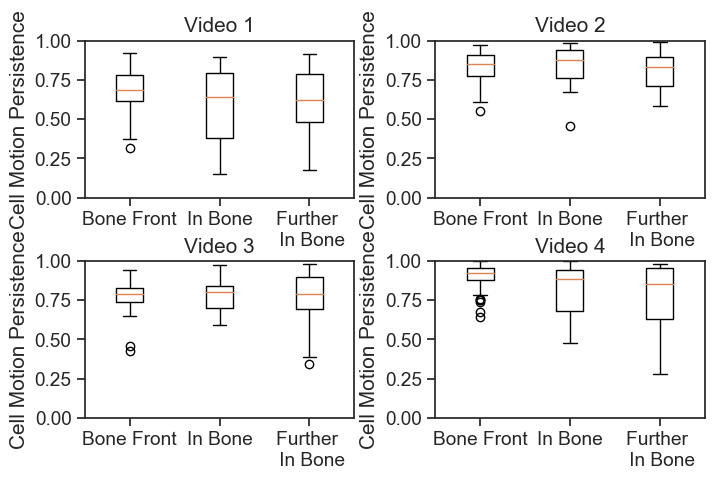

In [89]:
persistences_all_all = np.array([[None]*N_files_per_video for _ in range(N_videos)]);
persistences_all_all = np.array([[None]*N_files_per_video for _ in range(N_videos)]);
labels_all = np.array([[None]*N_files_per_video for _ in range(N_videos)]);

pers_df = pd.DataFrame(columns=['Video', 'Location', 'Persistence']); # store as dataframe
counter = 0;

names_compare_2 = ["Bone Front", "In Bone", "Further \n In Bone"];

fig, axs = plt.subplots(2, 2, figsize=(8, 5), dpi=100)

for i1 in range(N_videos):
    [ix, iy] = divmod(i1, 2)
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2];
        Y_all = Y_all_all[i1][i2];
        N_cells = N_cells_all[i1][i2];

        # calculate total displacement
        del_X_all = np.array(list(map(np.diff, X_all))); # X[t+1]-X[t] for all cells
        del_Y_all = np.array(list(map(np.diff, Y_all))); # Y[t+1]-Y[t] for all cells
        displacements_all = np.nansum( np.sqrt(del_X_all**2 + del_Y_all**2) , axis=1 );

        # calculate net displacement
        net_displacements_all = np.zeros(N_cells);
        for i in range(N_cells):
            X_t = X_all[i, :]; 
            Y_t = Y_all[i, :];
            dX = X_t[~np.isnan(X_t)][-1]-X_t[~np.isnan(X_t)][0]; # X(t_final) - X(t_initial)
            dY = Y_t[~np.isnan(Y_t)][-1]-Y_t[~np.isnan(Y_t)][0]; # Y(t_final) - Y(t_initial)
            net_displacements_all[i] = np.sqrt(dX**2 + dY**2);

        data_out = net_displacements_all/displacements_all;
        persistences_all_all[i1][i2] = data_out;
        labels_all[i1][i2] = '{}'.format(names_compare_2[i2]);
        
        for i3 in range( len(data_out)  ):
            pers_df.loc[counter] = [i1+1, names_compare[i2], data_out[i3]];
            counter += 1;
                
    # Plot figure
    axs[ix, iy].boxplot(persistences_all_all[i1,:], labels=labels_all[i1,:]);   
    axs[ix, iy].set(ylim=[0,1], title='Video {}'.format(i1+1) ); 
    axs[ix, iy].set(ylabel='Cell Motion Persistence');

plt.subplots_adjust(wspace=0.3, hspace=0.4)

# Save figure
fname_out = folder_figures + im_label + "persistence_of_motion";
label = '_all_videos';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")    

plt.show();

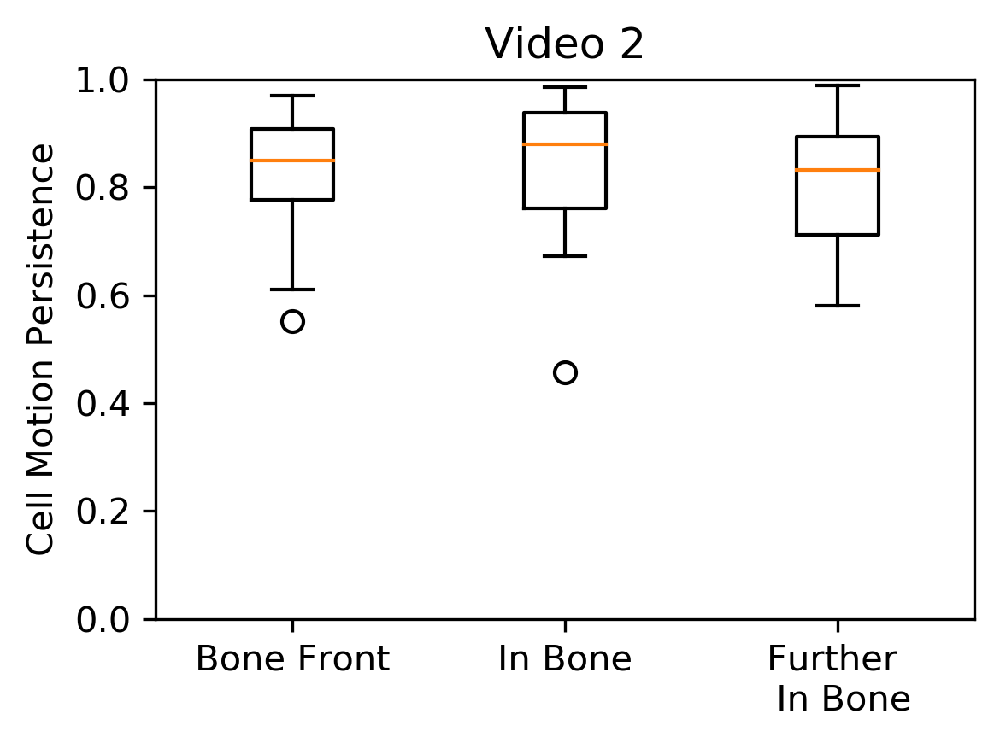

In [194]:
persistences_all_all = np.array([[None]*N_files_per_video for _ in range(N_videos)]);
labels_all = np.array([[None]*N_files_per_video for _ in range(N_videos)]);

names_compare_2 = ["Bone Front", "In Bone", "Further \n In Bone"];

# fig, axs = plt.subplots(2, 2, figsize=(8, 5), dpi=300)
plt.figure(figsize=(4, 3), dpi=300)
i1=1;
for i2 in range(N_files_per_video):
    X_all = X_all_all[i1][i2];
    Y_all = Y_all_all[i1][i2];
    N_cells = N_cells_all[i1][i2];

    # calculate total displacement
    del_X_all = np.array(list(map(np.diff, X_all))); # X[t+1]-X[t] for all cells
    del_Y_all = np.array(list(map(np.diff, Y_all))); # Y[t+1]-Y[t] for all cells
    displacements_all = np.nansum( np.sqrt(del_X_all**2 + del_Y_all**2) , axis=1 );

    # calculate net displacement
    net_displacements_all = np.zeros(N_cells);
    for i in range(N_cells):
        X_t = X_all[i, :]; 
        Y_t = Y_all[i, :];
        dX = X_t[~np.isnan(X_t)][-1]-X_t[~np.isnan(X_t)][0]; # X(t_final) - X(t_initial)
        dY = Y_t[~np.isnan(Y_t)][-1]-Y_t[~np.isnan(Y_t)][0]; # Y(t_final) - Y(t_initial)
        net_displacements_all[i] = np.sqrt(dX**2 + dY**2);

    persistences_all_all[i1][i2] = net_displacements_all/displacements_all;
    labels_all[i1][i2] = '{}'.format(names_compare_2[i2]);

# Plot figure
plt.boxplot(persistences_all_all[i1,:], labels=labels_all[i1,:]);   
plt.ylim([0,1])
plt.title('Video {}'.format(i1+1) ); 
plt.ylabel('Cell Motion Persistence');

plt.tight_layout()
plt.subplots_adjust(wspace=0.3, hspace=0.4)

# Save figure
fname_out = folder_figures + im_label + "persistence_of_motion";
label = '_video_2';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")    

plt.show();

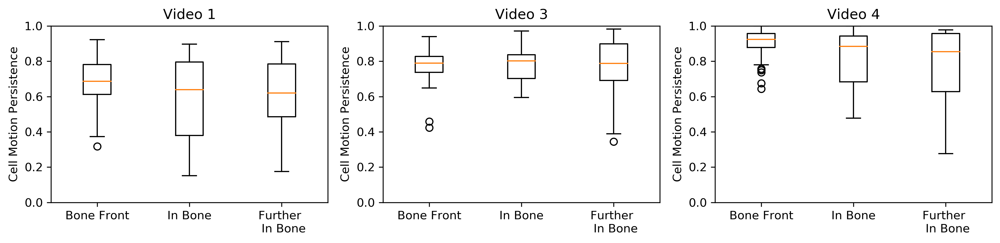

In [191]:
persistences_all_all = np.array([[None]*N_files_per_video for _ in range(N_videos)]);
labels_all = np.array([[None]*N_files_per_video for _ in range(N_videos)]);

names_compare_2 = ["Bone Front", "In Bone", "Further \n In Bone"];

fig, axs = plt.subplots(1, 3, figsize=(12, 3), dpi=300)
video_sel = [0, 2, 3];
for i0 in range(len(video_sel)):
    i1 = video_sel[i0];
    [ix, iy] = divmod(i1, 2)
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2];
        Y_all = Y_all_all[i1][i2];
        N_cells = N_cells_all[i1][i2];

        # calculate total displacement
        del_X_all = np.array(list(map(np.diff, X_all))); # X[t+1]-X[t] for all cells
        del_Y_all = np.array(list(map(np.diff, Y_all))); # Y[t+1]-Y[t] for all cells
        displacements_all = np.nansum( np.sqrt(del_X_all**2 + del_Y_all**2) , axis=1 );

        # calculate net displacement
        net_displacements_all = np.zeros(N_cells);
        for i in range(N_cells):
            X_t = X_all[i, :]; 
            Y_t = Y_all[i, :];
            dX = X_t[~np.isnan(X_t)][-1]-X_t[~np.isnan(X_t)][0]; # X(t_final) - X(t_initial)
            dY = Y_t[~np.isnan(Y_t)][-1]-Y_t[~np.isnan(Y_t)][0]; # Y(t_final) - Y(t_initial)
            net_displacements_all[i] = np.sqrt(dX**2 + dY**2);

        persistences_all_all[i1][i2] = net_displacements_all/displacements_all;
        labels_all[i1][i2] = '{}'.format(names_compare_2[i2]);
                
    # Plot figure
    axs[i0].boxplot(persistences_all_all[i1,:], labels=labels_all[i1,:]);   
    axs[i0].set(ylim=[0,1], title='Video {}'.format(i1+1) ); 
    axs[i0].set(ylabel='Cell Motion Persistence');

plt.subplots_adjust(wspace=0.3, hspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "persistence_of_motion";
label = '_videos_1_3_4';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")    

plt.show();

#### Combine experiments

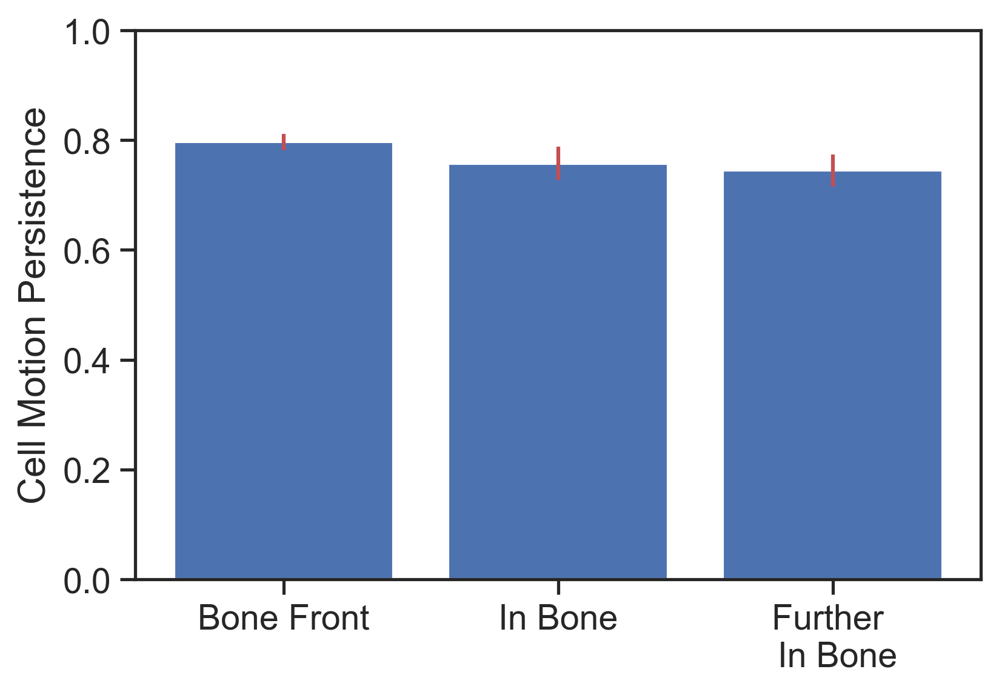

In [117]:
persistences_mean_all = np.mean([[np.mean(persistences_all_all[i1][i2]) for i1 in range(N_videos)] for i2 in range(N_files_per_video)], axis=1)
persistences_var_avg_all = [[np.var(persistences_all_all[i1][i2])/N_cells_all[i1][i2] for i1 in range(N_videos)] for i2 in range(N_files_per_video)]
persistences_sem_all = np.sqrt( np.array(list(map(np.sum, persistences_var_avg_all)))/N_videos );

fig, ax = plt.subplots(dpi=300)
plt.bar( np.arange(N_files_per_video), persistences_mean_all )
plt.errorbar( np.arange(N_files_per_video), persistences_mean_all, persistences_sem_all, fmt = ' ', color='r')
plt.ylim((0,1))
#plt.xticks([0, 1, 2])
ax.set_ylabel('Cell Motion Persistence')
ax.set_xticks( np.arange(N_files_per_video) )
ax.set_xticklabels(names_compare_2)

# Save figure
fname_out = folder_figures + im_label + "persistence_of_motion";
label = '_all_videos_averaged_bar';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps")   

plt.show();

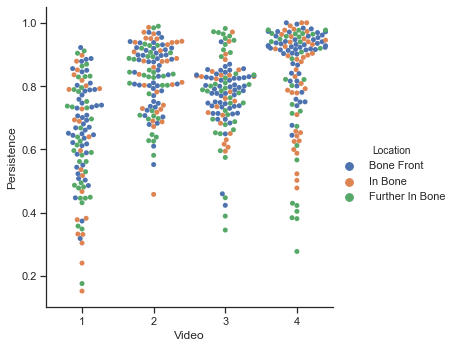

In [227]:
sns.set(style="ticks", color_codes=True)

# -- plot data only --
#h_plot = sns.catplot(x="Location", y="Persistence", hue="Video", data=pers_df);
h_plot = sns.catplot(x="Video", y="Persistence", hue="Location", kind="swarm", data=pers_df);

# facet grid 
#fig, axs = plt.subplots(ncols=4)
#h_plot = sns.catplot(x="Location", y="Persistence", col="Video", data=pers_df);
#sns.catplot(x="Location", y="Persistence", kind="swarm", data=data_plot, ax=g.axes[i]);

# -- plot statistics --
# box plot
#h_plot = sns.catplot(x="Location", y="Persistence", kind="box", hue="Video", data=pers_df);
#h_plot = sns.catplot(x="Video", y="Persistence", kind="box", hue="Location", data=pers_df);
# violin plot
#h_plot =  sns.catplot(x="Location", y="Persistence", kind="violin", inner=None, data=pers_df, ax=g.ax);
# bar plot (mean values)
#h_plot = sns.catplot(x="Location", y="Persistence", hue="Video", kind="bar", data=pers_df);

# Save figure
#fig = h_plot.get_figure()
fname_out = folder_figures + im_label + "persistence_of_motion";
#label = '_all_videos_box_plot_all_seaborn_sort_by_video';
label = '_all_videos_scatter_plot_all_seaborn_sort_by_video';
h_plot.savefig(fname_out + label + ".pdf") 
h_plot.savefig(fname_out + label + ".eps") 

### Approach 2: velocity correlation functions
The velocity autocorrelation function shows how cells maintain their velocity (speed and directionality) over time. The plots show the correlation between a specified initial time (e.g. t=0 hours) and all further times. The decay shows how well cells maintain their velocities over time. <br>
We normalize the velocities so that in the final plots we compare only directionality and not speed at different times.

<u>Technical notes</u> <br>
The velocity autocorrelation function is defined as $C_{VV}(t, t') = \langle v(t) v(t') \rangle$, 
where $\langle \ldots \rangle$ is an ensemble-average over all cells. <br>
Under time-invariance, $C_{VV}(t, t')$ would be a function of $|t-t'|$ only. However, for our system we expect the correlation to depend on both $t$ and $t'$, so choosing an apprioriate initial time to compare with is critical. 
Recall that $C_{VV}(t, t')$ decays exponentially for Brownian motion. <br>
Note that $C_{VV}(t, t')$ is unnormalized, but can be normalized to give Pearson correlation coefficients. We normalize by dividing all velocities by their norm, so that $|v(t)| = 1$ for all $t$.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


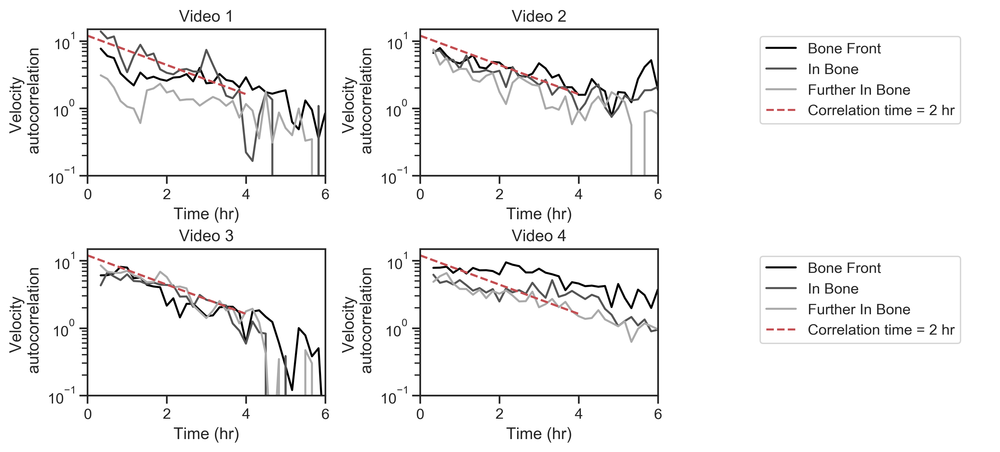

All velocities are relative to the "initial" velocity at time = 0.333 hrs


In [256]:
normalize = 0; # Normalize velocities?
t_init = 2; # initial time to correlate with
t_range = np.arange(len(slice_range))+t_init; # time range to plot 

ylabel_extra='Velocity';
if normalize:
    ylabel_extra = "Normalized velocity"
    
#fig, axs = plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=100)
velocities_all_all = [[None]*N_files_per_video for _ in range(N_videos)];
corr_v_all_all = np.zeros([N_videos, N_files_per_video, len(t_range)]);

fig, axs = plt.subplots(2, 3, figsize=(12, 5), dpi=300);

for i1 in range(N_videos):
    [ix, iy] = divmod(i1, 2); # positions of plots
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2];
        Y_all = Y_all_all[i1][i2];
        N_cells = N_cells_all[i1][i2];
        N_slices = N_slices_all[i1][i2];
        slices_all = slices_all_all[i1][i2];
        
        # calculate velocities
        del_X_all = np.array(list(map(np.diff, X_all))); # X[t+1]-X[t] for all cells
        del_Y_all = np.array(list(map(np.diff, Y_all))); # Y[t+1]-Y[t] for all cells
        velocities_all = np.swapaxes( np.swapaxes( np.array([del_X_all, del_Y_all])/pix_per_micron, 0, 1), 1, 2); # units: microns
        velocities_all_all[i1][i2] = velocities_all; # store for later use
        
        # calculate autocorrelation        
        correlations_all = np.zeros([N_cells, N_slices-t_init-1])*np.nan;
        for i_cell in range(velocities_all.shape[0]):  
            v_temp = velocities_all[i_cell]; # no normalization
            if normalize:
                norm = np.array(list(map(np.linalg.norm, v_temp))).reshape(len(v_temp), 1);
                v_temp = velocities_all[i_cell]/norm; # normalized velocities
            correlations_all[i_cell, :] = np.dot(v_temp[t_init:], v_temp[t_init]); # normalized
            
        correlation_func = np.nanmean(correlations_all, axis=0);
        #print(correlation_func.shape)
        
        corr_v_all_all[i1, i2, :] = correlation_func[t_range];
        
        axs[ix, iy].plot(slices_all[0, t_range], correlation_func[t_range], color=colors_cats[i2])
        #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
        this_title = 'Video {}'.format(i1+1);
        axs[ix, iy].set(xlabel='Time (hr)', ylabel='{} \n autocorrelation'.format(ylabel_extra), title=this_title);
        
        # plot dashed line
        x_all = np.array([0, 2, 4]);
        c = 12;
        tau = 2;
        y_all = c*np.exp( - x_all/tau )
        axs[ix, iy].plot(x_all, y_all, 'r--')
        
        if normalize:
            axs[ix, iy].set(xlim=[t_lower, t_upper], ylim=[-0.4, 1])
        else:
            axs[ix, iy].set(xlim=[t_lower, t_upper], yscale='log', ylim=[10**(-1), 15])

plt.subplots_adjust(hspace=0.5, wspace=0.4)

# ---- Legend ----
for row in range(2):
    for i, this_label in enumerate(names_compare):
        axs[row, 2].plot(np.nan, label=this_label, color=colors_cats[i])
    axs[row, 2].plot(np.nan, 'r--', label="Correlation time = {} hr".format(tau))
    axs[row, 2].legend(loc='upper left')
    axs[row, 2].axis('off')
    
# Save figure
fname_out = folder_figures + im_label + "velocity_correlations_in_time_t_init_{}".format(t_init);
label = '_all_videos_y_scale_log_red_line_corr_time_{}_hr'.format(tau);
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps") 

plt.show()

print('All velocities are relative to the "initial" velocity at time = {} hrs'.format(round(t_init/6, 3)))

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


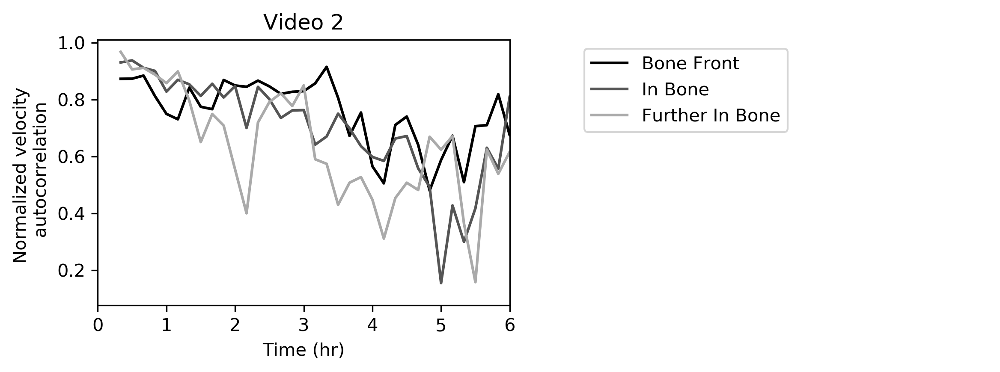

All velocities are relative to the "initial" velocity at time = 0.333 hrs


In [61]:
velocities_all_all = [[None]*N_files_per_video for _ in range(N_videos)];
fig, axs = plt.subplots(1, 2, figsize=(8, 3), dpi=300);

i1=1;
pix_per_micron = pix_per_micron_all[i1];
for i2 in range(N_files_per_video):
    X_all = X_all_all[i1][i2];
    Y_all = Y_all_all[i1][i2];
    N_cells = N_cells_all[i1][i2];
    N_slices = N_slices_all[i1][i2];
    slices_all = slices_all_all[i1][i2];
    correlation_func = corr_v_all_all[i1][i2];

    axs[0].plot(slices_all[0, t_range], correlation_func, color=colors_cats[i2])
    #this_title = 'Video {} ({}) {}, {} cells'.format(i1+1, video_labels[i1], names_compare[i2], str(N_cells));
    this_title = 'Video {}'.format(i1+1);
    axs[0].set(xlabel='Time (hr)', ylabel='{} \n autocorrelation'.format(ylabel_extra), title=this_title)
    axs[0].set(xlim=[t_lower, t_upper])

plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# ---- Legend ----
for i, this_label in enumerate(names_compare):
    axs[1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[1].legend(loc='upper left')
axs[1].axis('off')    

# Save figure
fname_out = folder_figures + im_label + "velocity_correlations_in_time";
label = '_video_2';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")

plt.show()

print('All velocities are relative to the "initial" velocity at time = {} hrs'.format(round(t_init/6, 3)))

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

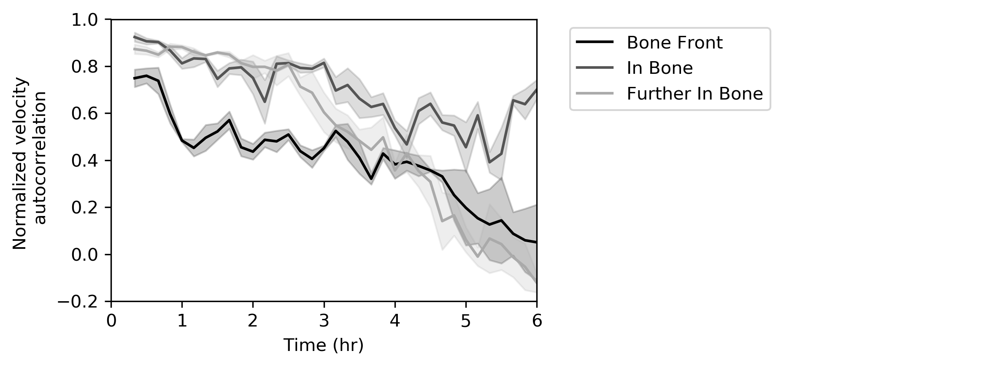

In [110]:
# average over different experiments
fig, axs = plt.subplots(1, 2, figsize=(8, 3), dpi=300)
i1=1;
pix_per_micron = pix_per_micron_all[i1];
video_sel = [0, 1, 2, 3];

for i2 in range(N_files_per_video):
    slices_all = slices_all_all[i1][i2];
    
    corr_avg = np.mean(corr_v_all_all[:][i2], axis=(0))
    corr_sem = np.std(corr_v_all_all[:][i2], axis=(0))/np.sqrt(N_videos);
    
    # Plot in same graph
    axs[0].plot(slices_all[0, t_range], corr_avg, color=colors_cats[i2])
    axs[0].fill_between(slices_all[0, t_range], corr_avg-corr_sem, corr_avg+corr_sem, color=colors_cats[i2], alpha=0.2)
    axs[0].set(xlabel='Time (hr)', ylabel='{} \n autocorrelation'.format(ylabel_extra) )
    axs[0].set(xlim=[t_lower, t_upper], ylim=[-0.2, 1])

#plt.figure(dpi=100, figsize = (2, 1) )
i0=0;
for i, this_label in enumerate(names_compare):
    axs[i0+1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[i0+1].legend(loc='upper left')
axs[i0+1].axis('off')

plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "velocity_correlations_in_time";
label = '_all_videos_averaged';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps")    

plt.show()

# (3) Spatial correlations
How do correlations between cell motions depend on the spatial locations and distances between cells? <br>

### Spatial velocity correlations
Define $C_{VV}(x_i, x_j) = \langle v(x_i, t)\, v(x_j, t) \rangle$ as the spatial correlation function of cell velocities. Assume $C_{VV}(x_i, x_j) = C_{VV}(x_i-x_j)$ and average over cells with the same distance (in practice, bin together pairs of cells that have similar distance to each other). 

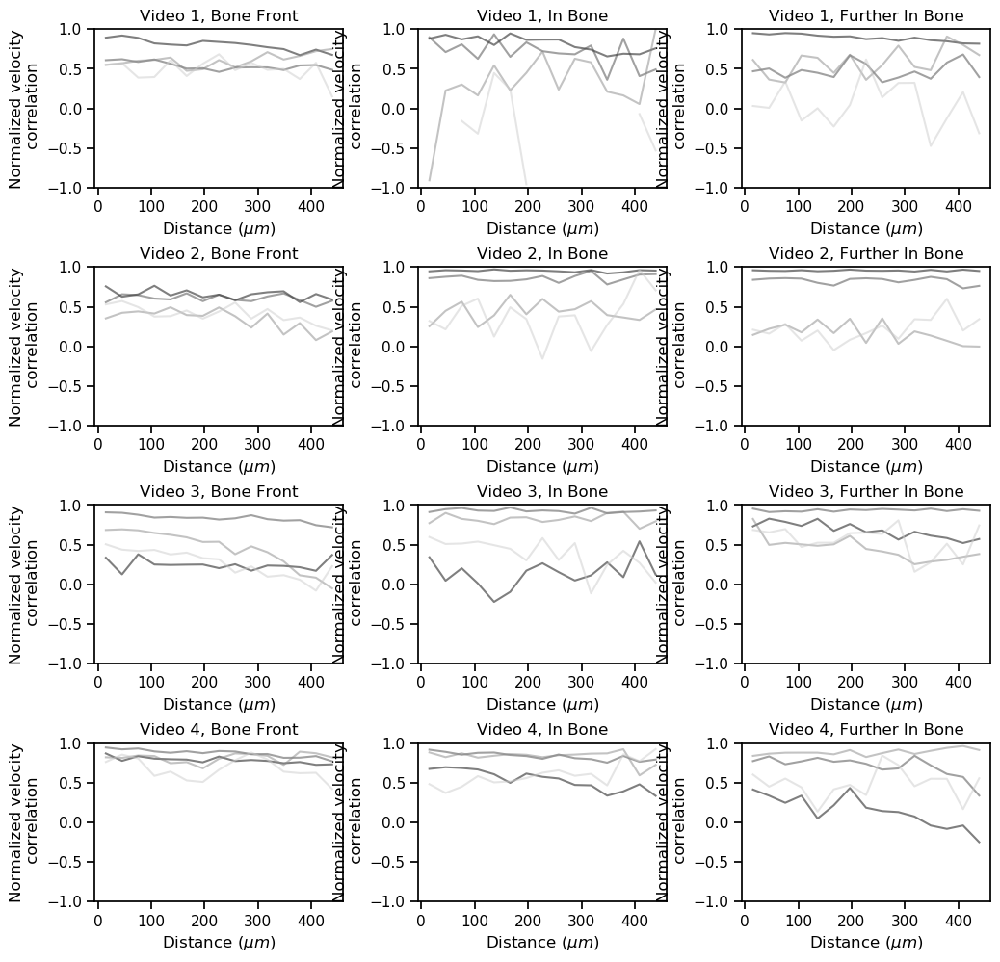

Lighter colors = later times


In [9]:
# Original: in pixel units
nbins = 15;
edges = np.linspace(0, 2000, nbins+1)
#t_selected = np.arange(0, N_slices_all[i1][i2]-1, 6) # <--- adjust plotted times
t_selected = np.array([0, 2, 4, 6])*6; #np.arange(0, N_slices_all[i1][i2]-1, 6) 
normalize = 1;
ylabel_extra='Velocity';
if normalize:
    ylabel_extra = "Normalized velocity"
    
corr_v_all_all = np.zeros([N_videos, N_files_per_video, len(t_selected), nbins]);

# calculate velocities?
calc_velocities = 1;
if calc_velocities:
    velocities_all_all = [[None]*N_files_per_video for _ in range(N_videos)];

fig, axs = plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=100)
for i1 in range(N_videos):
    #[ix, iy] = divmod(i1, 2); # positions of plots
    #pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        t_idx=0;
        for t in t_selected:
            X_all = X_all_all[i1][i2][:, t];
            Y_all = Y_all_all[i1][i2][:, t];

            # filter out cells which are not tracked
            if t<N_slices_all[i1][i2]:
                cell_filter = ~np.isnan( X_all_all[i1][i2][:, t+1] ); # cell posiiton still defined the next time step
            else:
                cell_filter = ~np.isnan( X_all_all[i1][i2][:, t] );
            X_all = X_all[cell_filter];
            Y_all = Y_all[cell_filter];

            # pairwise distances between cells
            incl_self = 0; # include self-pairs of the form [i,i]?

            # calculate pairwise distances
            X_all_paired = np.array([ [X_all[i], X_all[j]] for i in range(len(X_all)) for j in range(i+incl_self)]); # loop j over range(i+1) to include self-pairs, or range(i) to exclude self-pairs
            Y_all_paired = np.array([ [Y_all[i], Y_all[j]] for i in range(len(Y_all)) for j in range(i+incl_self)]);
            def f(x, y):
                return np.sqrt((x[0]-x[1])**2 + (y[0]-y[1])**2)
            pairwise_dist_all = np.array(list(map(f, X_all_paired, Y_all_paired )) );
            
            # calculate velocities
            if calc_velocities:
                # calculate velocities
                del_X_all = np.array(list(map(np.diff, X_all_all[i1][i2]))); # X[t+1]-X[t] for all cells
                del_Y_all = np.array(list(map(np.diff, Y_all_all[i1][i2]))); # Y[t+1]-Y[t] for all cells
                velocities_all = np.swapaxes( np.swapaxes( np.array([del_X_all, del_Y_all])/pix_per_micron, 0, 1), 1, 2); # units: microns
                velocities_all_all[i1][i2] = velocities_all; # store for later use
            this_velocities_all = velocities_all_all[i1][i2][cell_filter, t, :];

            # linear to pair indices
            pair_idx = np.array([ [i, j] for i in range(len(X_all)) for j in range(i+incl_self)]); 

            # define bin edges, bin weights
            # everything that falls outside of the edges of the pre-defined bins is neglected
            hist_data, edges = np.histogram(pairwise_dist_all, bins = edges);
            compare_bin_edges = np.array([pairwise_dist_all[i] <= edges for i in range(len(pairwise_dist_all))]);
            bin_idx = np.array(list(map( np.argmax, compare_bin_edges))); # indices of the bins of all the data

            # calculate correlations
            corr_v_all = np.zeros(len(edges)-1); # correlation function
            temp_sum = [];
            for i in range(1, len(edges)):
                bin_i_idx = np.argwhere(bin_idx==i).flatten(); # linear indices that fall in bin i
                temp_sum.append(len(bin_i_idx));
                bin_i_pair_idx = pair_idx[bin_i_idx]; # pair indices that fall in bin i
                this_corr_v = np.zeros( len(bin_i_pair_idx) );
                for j in range(len(bin_i_pair_idx)):
                    cell_1=bin_i_pair_idx[j][0]
                    cell_2=bin_i_pair_idx[j][1]
                    v1 = this_velocities_all[cell_1];
                    v2 = this_velocities_all[cell_2];
                    #corr_v_all[i] += np.inner(v1, v2)/np.linalg.norm(v1)/np.linalg.norm(v2); 
                    corr_temp = np.inner(v1, v2);
                    if normalize and np.linalg.norm(v1)!=0 and np.linalg.norm(v2)!=0:
                        corr_temp = corr_temp/np.linalg.norm(v1)/np.linalg.norm(v2);  
                    this_corr_v[j] = corr_temp;
                #corr_v_all[i] = corr_v_all[i]/len(bin_i_pair_idx);
                corr_v_all[i-1] = np.nanmean(this_corr_v);

            # plot results
            bincenters = (edges[1:]+edges[:-1])/2;
            #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
            axs[i1, i2].plot(bincenters/pix_per_micron, corr_v_all, color=np.ones(3)*0.8*(t/t_selected[-1]), alpha=0.5)
            
            # store all results
            corr_v_all_all[i1, i2, t_idx, :] = corr_v_all;
            t_idx += 1;
            
        this_title = 'Video {}, {}'.format(i1+1, names_compare[i2]);
        axs[i1, i2].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra))
        if normalize:
            axs[i1, i2].set(ylim = (-1, 1))
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_time".format(ylabel_extra);
label = '_all_videos';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps") 

plt.show()

print( "Lighter colors = later times" )
# Display legend

# axs[1].plot(np.nan, label='t={}'.format(t/6));
# axs[1].legend(loc='upper left')
# axs[1].set(xticks=[], yticks=[]);
# axs[1].axis('off')
# plt.xlabel('Distance ($\mu m$)')
# plt.ylabel('Velocity correlation')
# plt.ylim([-1, 1])

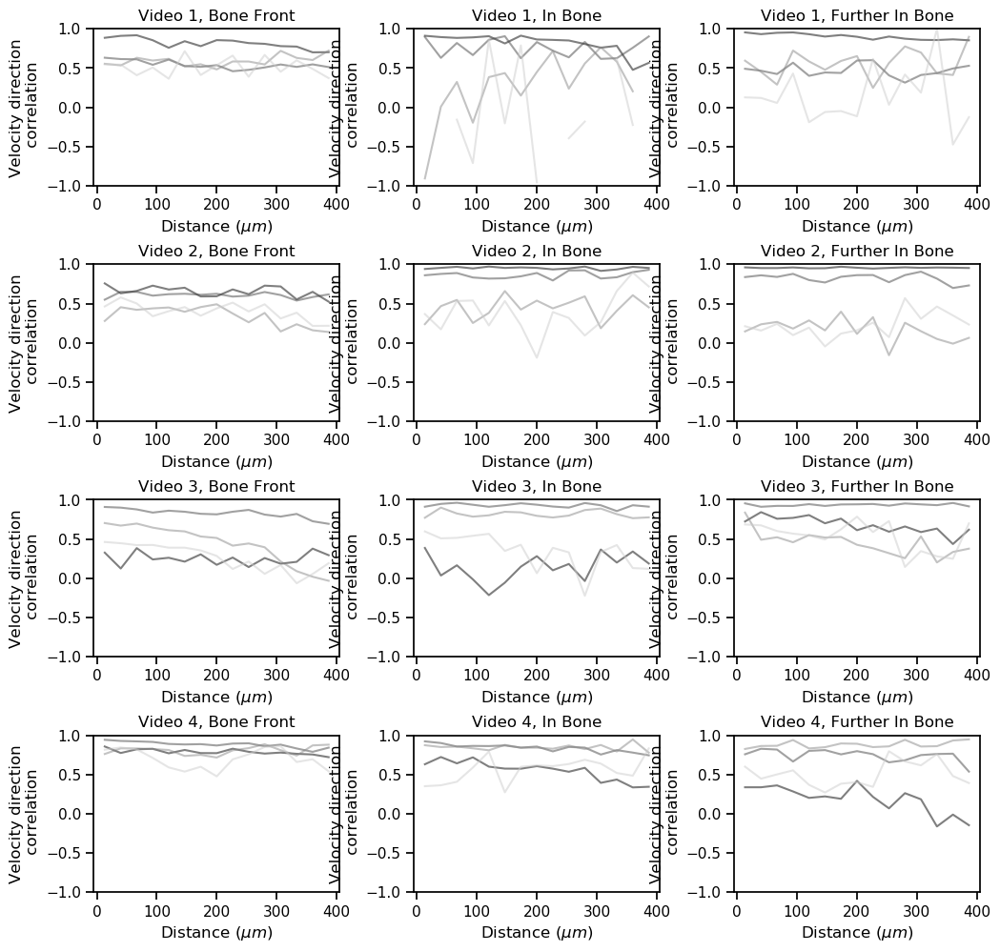

Lighter colors = later times


In [34]:
# New: microns
nbins = 15;
edges = np.linspace(0, 400, nbins+1) # units: microns
#t_selected = np.arange(0, N_slices_all[i1][i2]-1, 6) # <--- adjust plotted times
t_selected = np.array([0, 2, 4, 6])*6; #np.arange(0, N_slices_all[i1][i2]-1, 6) 
normalize = 1;
ylabel_extra='Velocity';
if normalize:
    ylabel_extra = "Velocity direction"
    
corr_v_all_all = np.zeros([N_videos, N_files_per_video, len(t_selected), nbins]);

# calculate velocities?
calc_velocities = 1;
if calc_velocities:
    velocities_all_all = [[None]*N_files_per_video for _ in range(N_videos)];

fig, axs = plt.subplots(N_videos, N_files_per_video, figsize=(12, 12), dpi=100)
for i1 in range(N_videos):
    #[ix, iy] = divmod(i1, 2); # positions of plots
    pix_per_micron = pix_per_micron_all[i1];
    for i2 in range(N_files_per_video):
        t_idx=0;
        for t in t_selected:
            X_all = X_all_all[i1][i2][:, t];
            Y_all = Y_all_all[i1][i2][:, t];

            # filter out cells which are not tracked
            if t<N_slices_all[i1][i2]:
                cell_filter = ~np.isnan( X_all_all[i1][i2][:, t+1] ); # cell posiiton still defined the next time step
            else:
                cell_filter = ~np.isnan( X_all_all[i1][i2][:, t] );
            X_all = X_all[cell_filter];
            Y_all = Y_all[cell_filter];

            # pairwise distances between cells
            incl_self = 0; # include self-pairs of the form [i,i]?

            # calculate pairwise distances, rescale distances to microns
            X_all_paired = np.array([ [X_all[i], X_all[j]] for i in range(len(X_all)) for j in range(i+incl_self)]); # loop j over range(i+1) to include self-pairs, or range(i) to exclude self-pairs
            Y_all_paired = np.array([ [Y_all[i], Y_all[j]] for i in range(len(Y_all)) for j in range(i+incl_self)]);
            def f(x, y):
                return np.sqrt((x[0]-x[1])**2 + (y[0]-y[1])**2)
            pairwise_dist_all = np.array(list(map(f, X_all_paired, Y_all_paired )) )/pix_per_micron;
            
            # calculate velocities
            if calc_velocities:
                # calculate velocities
                del_X_all = np.array(list(map(np.diff, X_all_all[i1][i2]))); # X[t+1]-X[t] for all cells
                del_Y_all = np.array(list(map(np.diff, Y_all_all[i1][i2]))); # Y[t+1]-Y[t] for all cells
                velocities_all = np.swapaxes( np.swapaxes( np.array([del_X_all, del_Y_all])/pix_per_micron, 0, 1), 1, 2); # units: microns
                velocities_all_all[i1][i2] = velocities_all; # store for later use
            this_velocities_all = velocities_all_all[i1][i2][cell_filter, t, :];

            # linear to pair indices
            pair_idx = np.array([ [i, j] for i in range(len(X_all)) for j in range(i+incl_self)]); 

            # define bin edges, bin weights
            # everything that falls outside of the edges of the pre-defined bins is neglected
            hist_data, edges = np.histogram(pairwise_dist_all, bins = edges);
            compare_bin_edges = np.array([pairwise_dist_all[i] <= edges for i in range(len(pairwise_dist_all))]);
            bin_idx = np.array(list(map( np.argmax, compare_bin_edges))); # indices of the bins of all the data

            # calculate correlations
            corr_v_all = np.zeros(len(edges)-1); # correlation function
            temp_sum = [];
            for i in range(1, len(edges)):
                bin_i_idx = np.argwhere(bin_idx==i).flatten(); # linear indices that fall in bin i
                temp_sum.append(len(bin_i_idx));
                bin_i_pair_idx = pair_idx[bin_i_idx]; # pair indices that fall in bin i
                this_corr_v = np.zeros( len(bin_i_pair_idx) );
                for j in range(len(bin_i_pair_idx)):
                    cell_1=bin_i_pair_idx[j][0]
                    cell_2=bin_i_pair_idx[j][1]
                    v1 = this_velocities_all[cell_1];
                    v2 = this_velocities_all[cell_2];
                    #corr_v_all[i] += np.inner(v1, v2)/np.linalg.norm(v1)/np.linalg.norm(v2); 
                    corr_temp = np.inner(v1, v2);
                    if normalize and np.linalg.norm(v1)!=0 and np.linalg.norm(v2)!=0:
                        corr_temp = corr_temp/np.linalg.norm(v1)/np.linalg.norm(v2);  
                    this_corr_v[j] = corr_temp;
                #corr_v_all[i] = corr_v_all[i]/len(bin_i_pair_idx);
                corr_v_all[i-1] = np.nanmean(this_corr_v);

            # plot results
            bincenters = (edges[1:]+edges[:-1])/2;
            #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
            axs[i1, i2].plot(bincenters, corr_v_all, color=np.ones(3)*0.8*(t/t_selected[-1]), alpha=0.5)
            
            # store all results
            corr_v_all_all[i1, i2, t_idx, :] = corr_v_all;
            t_idx += 1;
            
        this_title = 'Video {}, {}'.format(i1+1, names_compare[i2]);
        axs[i1, i2].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra))
        if normalize:
            axs[i1, i2].set(ylim = (-1, 1))
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_time".format(ylabel_extra);
label = '_all_videos';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps") 

plt.show()

print( "Lighter colors = later times" )

<b>Conclusion</b>: no significant spatial dependence of velocity correlations. Generally, cells far away from each other are just as likely to move in the same direction as cells close to each other.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

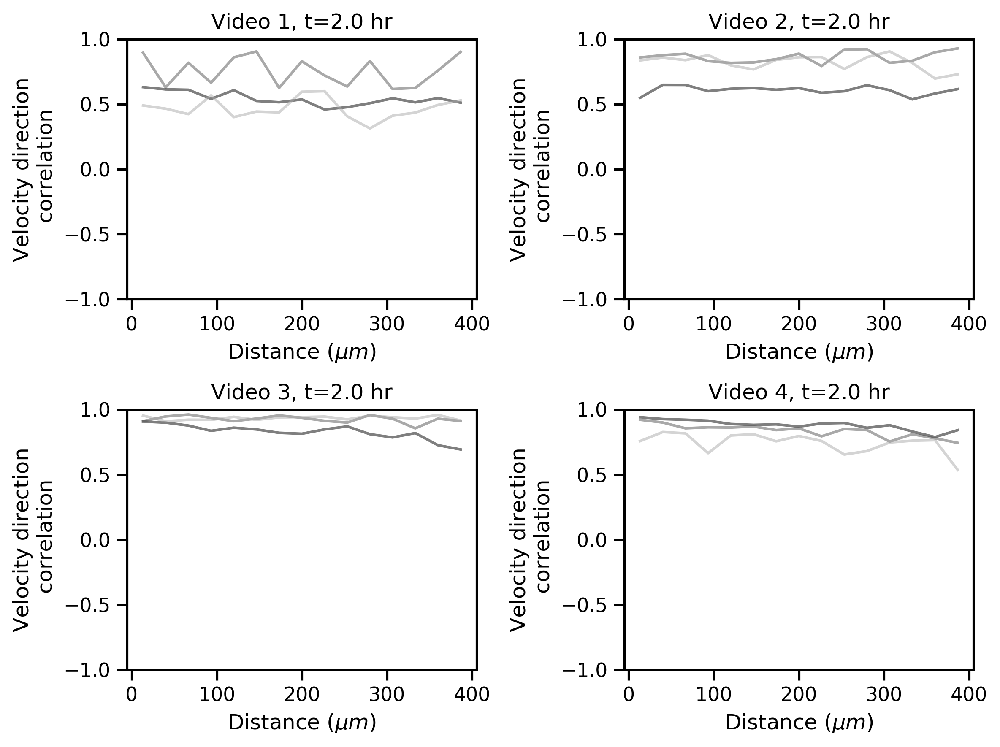

In [35]:
t_idx = 1;
t = (t_idx+1)*6;
ncol = len(t_idx_selected);

fig, axs = plt.subplots(2, 2, figsize=(4*2, 3*2), dpi=300)

for i1 in range(N_videos):
    [ix, iy] = divmod(i1, 2); # positions of plots
    pix_per_micron = pix_per_micron_all[i1];        
    for i2 in range(N_files_per_video):
        corr_v_all = corr_v_all_all[i1, i2, t_idx, :];

        # plot results
        bincenters = (edges[1:]+edges[:-1])/2;
        #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
        axs[ix, iy].plot(bincenters, corr_v_all, color=colors_cats[i2], alpha=0.5)

    this_title = 'Video {}, t={} hr'.format(i1+1, t/6);
    axs[ix, iy].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = 'Velocity direction\n correlation'.format(ylabel_extra))
    if normalize:
        axs[ix, iy].set_ylim( (-1, 1) )

plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_space_t_2_hr_new".format(ylabel_extra);
label = '_all_videos';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps") 

plt.show()

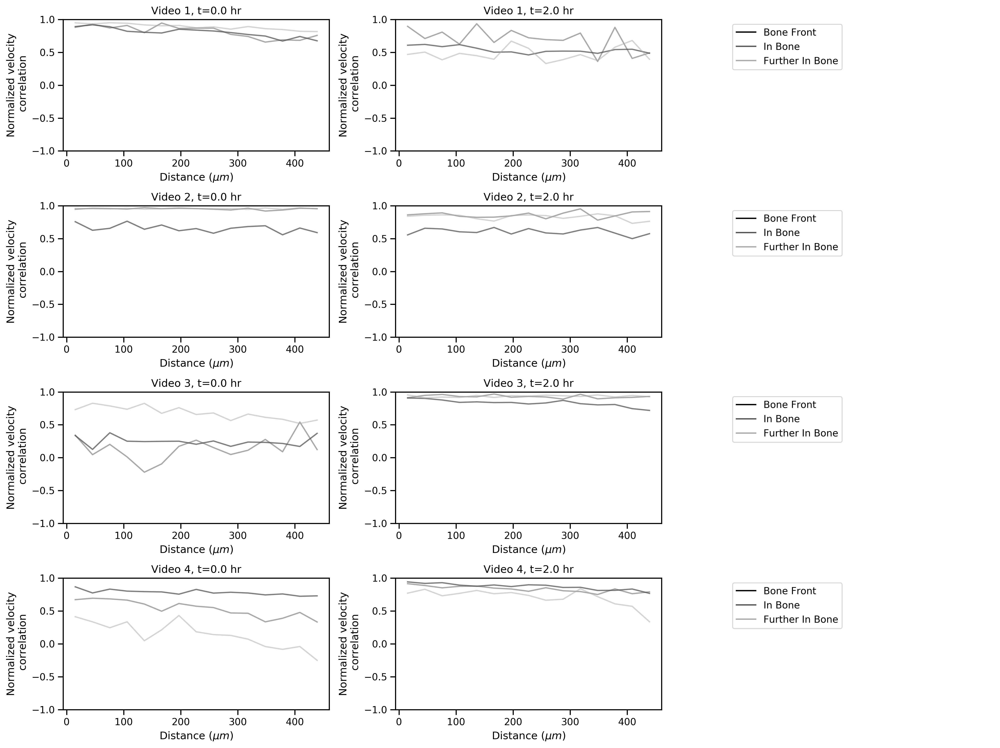

In [17]:
t_idx_selected = np.array([0, 2]); #np.arange(len(t_selected)-1); #np.array([0, 2, 4, 6])*6; #np.arange(0, N_slices_all[i1][i2]-1, 6) 
ncol = len(t_idx_selected);

fig, axs = plt.subplots(N_videos, ncol+1, figsize=(16, 12), dpi=300)

for i1 in range(N_videos):
    #[ix, iy] = divmod(i1, 2); # positions of plots
    #pix_per_micron = pix_per_micron_all[i1];
    for t_idx in range(ncol):
        t = t_selected[t_idx];
        for i2 in range(N_files_per_video):
            corr_v_all = corr_v_all_all[i1, i2, t_idx, :];
            
            # plot results
            bincenters = (edges[1:]+edges[:-1])/2;
            #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
            axs[i1, t_idx].plot(bincenters/pix_per_micron, corr_v_all, color=colors_cats[i2], alpha=0.5)
            
        this_title = 'Video {}, t={} hr'.format(i1+1, t/6);
        axs[i1, t_idx].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra))
        if normalize:
            axs[i1, t_idx].set_ylim( (-1, 1) )

# ---- Legend ----
for row in range(4):
    for i, this_label in enumerate(names_compare):
        axs[row, ncol].plot(np.nan, label=this_label, color=colors_cats[i])
    axs[row, ncol].legend(loc='upper left')
    axs[row, ncol].axis('off')    
        
plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_space_t_0_2_4_hr".format(ylabel_extra);
label = '_all_videos';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps") 

plt.show()


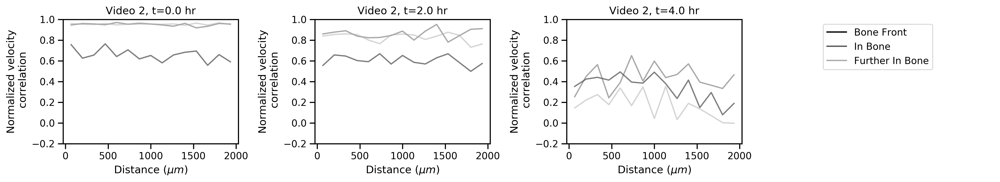

In [12]:
t_idx_selected = np.arange(len(t_selected)-1); #np.array([0, 2, 4, 6])*6; #np.arange(0, N_slices_all[i1][i2]-1, 6) 
fig, axs = plt.subplots(1, 4, figsize=(16, 3), dpi=300)

i1 = 1;
for t_idx in range(len(t_idx_selected)):
    t = t_selected[t_idx];
    for i2 in range(N_files_per_video):
        corr_v_all = corr_v_all_all[i1, i2, t_idx, :];

        # plot results
        bincenters = (edges[1:]+edges[:-1])/2;
        #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
        axs[t_idx].plot(bincenters, corr_v_all, color=colors_cats[i2], alpha=0.5)

    this_title = 'Video {}, t={} hr'.format(i1+1, t/6);
    axs[t_idx].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra));
    if normalize:
        axs[t_idx].set_ylim( (-0.2, 1) )

# ---- Legend ----
for i, this_label in enumerate(names_compare):
    axs[t_idx+1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[t_idx+1].legend(loc='upper left')
axs[t_idx+1].axis('off')    
        
plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_space_t_0_2_4_hr".format(ylabel_extra);
label = '_video_2';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps") 

plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

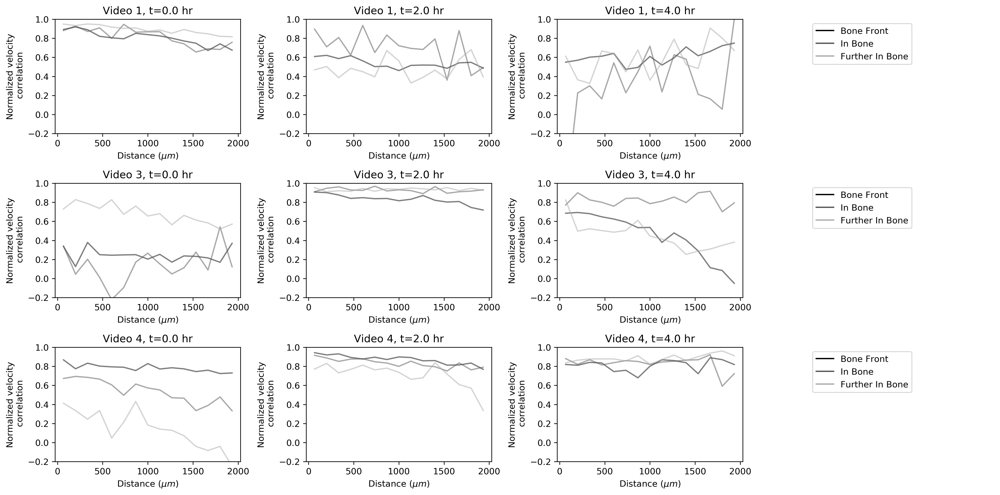

In [68]:
t_idx_selected = np.arange(len(t_selected)-1); #np.array([0, 2, 4, 6])*6; #np.arange(0, N_slices_all[i1][i2]-1, 6) 
video_sel = [0, 2, 3];

fig, axs = plt.subplots(N_videos-1, len(t_idx_selected)+1, figsize=(16, 8), dpi=300)

for i0 in range(len(video_sel)):
    i1 = video_sel[i0];
    #[ix, iy] = divmod(i1, 2); # positions of plots
    #pix_per_micron = pix_per_micron_all[i1];
    for t_idx in range(len(t_idx_selected)):
        t = t_selected[t_idx];
        for i2 in range(N_files_per_video):
            corr_v_all = corr_v_all_all[i1, i2, t_idx, :];
            
            # plot results
            bincenters = (edges[1:]+edges[:-1])/2;
            #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
            axs[i0, t_idx].plot(bincenters, corr_v_all, color=colors_cats[i2], alpha=0.5)
            
        this_title = 'Video {}, t={} hr'.format(i1+1, t/6);
        axs[i0, t_idx].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra));
        if normalize:
            axs[i0, t_idx].set_ylim( (-0.2, 1) )

# ---- Legend ----
for row in range(N_videos-1):
    for i, this_label in enumerate(names_compare):
        axs[row, 3].plot(np.nan, label=this_label, color=colors_cats[i])
    axs[row, 3].legend(loc='upper left')
    axs[row, 3].axis('off')
    
        
plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_space_t_0_2_4_hr".format(ylabel_extra);
label = '_videos_1_3_4';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps") 

plt.show()

#### Average over experiments

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

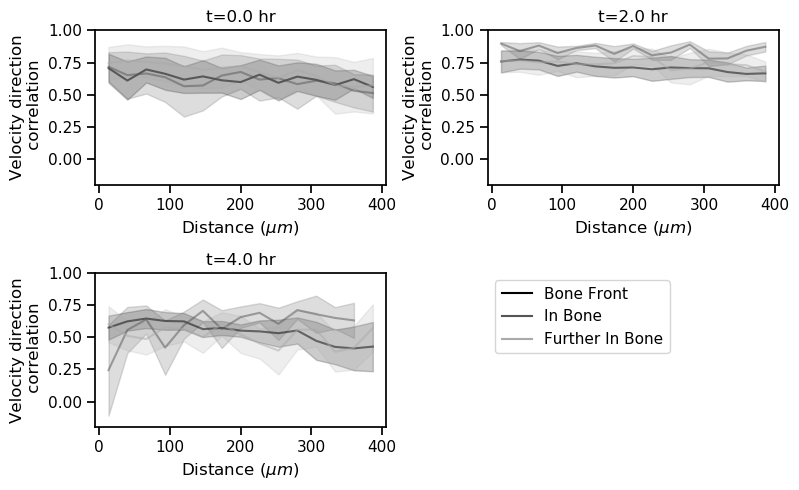

In [37]:
t_idx_selected = np.arange(len(t_selected)-1); #np.array([0, 2, 4, 6])*6; #np.arange(0, N_slices_all[i1][i2]-1, 6) 
video_sel = [0, 1, 2, 3];
ylabel_extra = 'Velocity direction';

#fig, axs = plt.subplots(len(t_idx_selected)+1, 1, figsize=(4, 2.5*(N_videos+1)), dpi=100)
fig, axs = plt.subplots(2, 2, figsize=(4*2, 2.5*(2)), dpi=100)

for t_idx in range(len(t_idx_selected)):
    t = t_selected[t_idx];
    [ix, iy] = np.divmod(t_idx, 2);
    for i2 in range(N_files_per_video):
        corr_v_all_avg = np.mean( corr_v_all_all[:, i2, t_idx, :], axis=0 )
        corr_v_all_sem = np.std( corr_v_all_all[:, i2, t_idx, :], axis=0 )/np.sqrt(N_videos);
        
        # plot results
        bincenters = (edges[1:]+edges[:-1])/2;
        #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
        #axs[t_idx].plot(bincenters, corr_v_all_avg, color=colors_cats[i2], alpha=0.5)
        #axs[t_idx].fill_between(bincenters, corr_v_all_avg-corr_v_all_sem, corr_v_all_avg+corr_v_all_sem, color=colors_cats[i2], alpha=0.2)
        
        axs[ix, iy].plot(bincenters, corr_v_all_avg, color=colors_cats[i2], alpha=0.5)
        axs[ix, iy].fill_between(bincenters, corr_v_all_avg-corr_v_all_sem, corr_v_all_avg+corr_v_all_sem, color=colors_cats[i2], alpha=0.2)
        
    this_title = 't={} hr'.format(t/6);
    #axs[t_idx].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra));
    axs[ix, iy].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra));
    if normalize:
        #axs[t_idx].set_ylim( (-0.2, 1) )
        axs[ix, iy].set_ylim( (-0.2, 1) )

# ---- Legend ----
# for i, this_label in enumerate(names_compare):
#     axs[len(t_idx_selected)].plot(np.nan, label=this_label, color=colors_cats[i])
# axs[len(t_idx_selected)].legend(loc='upper left')
# axs[len(t_idx_selected)].axis('off')
for i, this_label in enumerate(names_compare):
    axs[1, 1].plot(np.nan, label=this_label, color=colors_cats[i])
axs[1, 1].legend(loc='upper left')
axs[1, 1].axis('off')
        
plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_space_t_0_2_4_hr".format(ylabel_extra);
label = 'all_videos_normalized_box_layout_in_microns';
# plt.savefig(fname_out + label + ".pdf")
# plt.savefig(fname_out + label + ".eps") 

plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

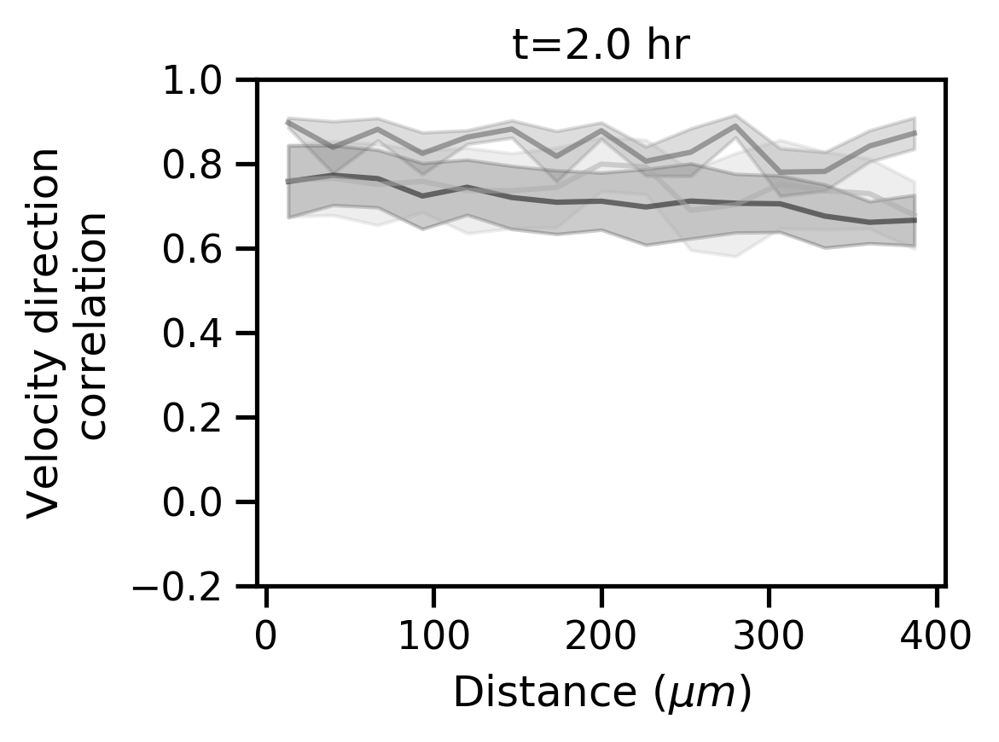

In [43]:
# single result
t_idx = 1; #np.arange(len(t_selected)-1); #np.array([0, 2, 4, 6])*6; #np.arange(0, N_slices_all[i1][i2]-1, 6) 
t = t_selected[t_idx];
video_sel = [0, 1, 2, 3];
ylabel_extra = 'Velocity direction';

#fig, axs = plt.subplots(len(t_idx_selected)+1, 1, figsize=(4, 2.5*(N_videos+1)), dpi=100)
fig, axs = plt.subplots(1, 1, figsize=(4, 3), dpi=300)

for i2 in range(N_files_per_video):
    corr_v_all_avg = np.mean( corr_v_all_all[:, i2, t_idx, :], axis=0 )
    corr_v_all_sem = np.std( corr_v_all_all[:, i2, t_idx, :], axis=0 )/np.sqrt(N_videos);

    # plot results
    bincenters = (edges[1:]+edges[:-1])/2;
    #axs[i1, i2].plot(bincenters, corr_v_all, alpha=0.5);
    #axs[t_idx].plot(bincenters, corr_v_all_avg, color=colors_cats[i2], alpha=0.5)
    #axs[t_idx].fill_between(bincenters, corr_v_all_avg-corr_v_all_sem, corr_v_all_avg+corr_v_all_sem, color=colors_cats[i2], alpha=0.2)

    axs.plot(bincenters, corr_v_all_avg, color=colors_cats[i2], alpha=0.5)
    axs.fill_between(bincenters, corr_v_all_avg-corr_v_all_sem, corr_v_all_avg+corr_v_all_sem, color=colors_cats[i2], alpha=0.2)

this_title = 't={} hr'.format(t/6);
#axs[t_idx].set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra));
axs.set(title=this_title, xlabel = 'Distance ($\mu m$)', ylabel = '{}\n correlation'.format(ylabel_extra));
if normalize:
    #axs[t_idx].set_ylim( (-0.2, 1) )
    axs.set_ylim( (-0.2, 1) )
        
plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.tight_layout()

# Save figure
fname_out = folder_figures + im_label + "{}_correlations_in_space_t_0_2_4_hr".format(ylabel_extra);
label = 'all_videos_normalized_box_layout_t_2hr_in_microns';
plt.savefig(fname_out + label + ".pdf")
plt.savefig(fname_out + label + ".eps") 

plt.show()

### Check that the number of pairs of cells in each of the bins is roughly equal
(or at least, that there are no bins which have very few cells)

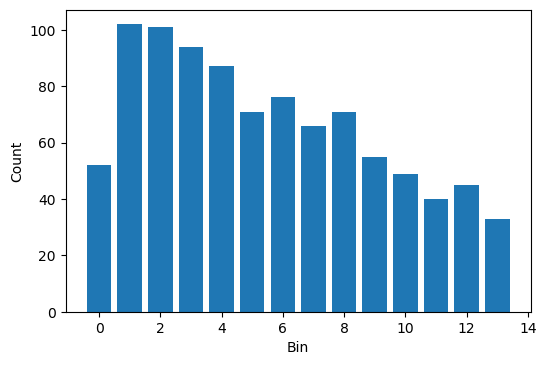

In [407]:
t = 0;
#------------ Recompute bins ------------------ 
X_all = X_all_all[i1][i2][:, t]; Y_all = Y_all_all[i1][i2][:, t];
if t<N_slices_all[i1][i2]:
    cell_filter = ~np.isnan( X_all_all[i1][i2][:, t+1] ); # cell posiiton still defined the next time step
else:
    cell_filter = ~np.isnan( X_all_all[i1][i2][:, t] );
X_all = X_all[cell_filter]; Y_all = Y_all[cell_filter];
X_all_paired = np.array([ [X_all[i], X_all[j]] for i in range(len(X_all)) for j in range(i+incl_self)]); # loop j over range(i+1) to include self-pairs, or range(i) to exclude self-pairs
Y_all_paired = np.array([ [Y_all[i], Y_all[j]] for i in range(len(Y_all)) for j in range(i+incl_self)]);
def f(x, y):
    return np.sqrt((x[0]-x[1])**2 + (y[0]-y[1])**2)
pairwise_dist_all = np.array(list(map(f, X_all_paired, Y_all_paired )) );
this_velocities_all = velocities_all_all[i1][i2][cell_filter, t, :];
pair_idx = np.array([ [i, j] for i in range(len(X_all)) for j in range(i+incl_self)]); 
hist_data, edges = np.histogram(pairwise_dist_all, bins = edges);
#----------------------------------------------

plt.figure(dpi=100);
bincenters = (edges[1:]+edges[:-1])/2
plt.bar(range(len(hist_data)), hist_data)
#plt.plot([0, 900], 20*np.ones(2), 'r--')
plt.xlabel('Bin')
plt.ylabel('Count')
plt.show()

In [397]:
# --- Troubleshoot ---
print( hist_data )
print( temp_sum )
print(np.sum(bin_idx==0) )
#print( np.argwhere( np.array(list(map( np.argmax, compare_bin_edges))) == 0 ) )
this_bin = 2;
print( pairwise_dist_all[this_bin] )
print( compare_bin_edges[this_bin] )
print( pair_idx[this_bin] )
# print( X_all_all[i1][i2][10, t], X_all_all[i1][i2][5, t] )
# print( Y_all_all[i1][i2][10, t], Y_all_all[i1][i2][5, t] )

[40 74 71 62 52 61 52 50 42 31 32 25 20 23]
[40, 74, 71, 62, 52, 61, 52, 50, 42, 31, 32, 25, 20, 23]
31
201.2411488736834
[False False  True  True  True  True  True  True  True  True  True  True
  True  True  True]
[2 1]


### Pairwise distance statistics

Before plotting the correlation functions, we should examine the distribution of all pairwise distances of the tracked cells. <br>

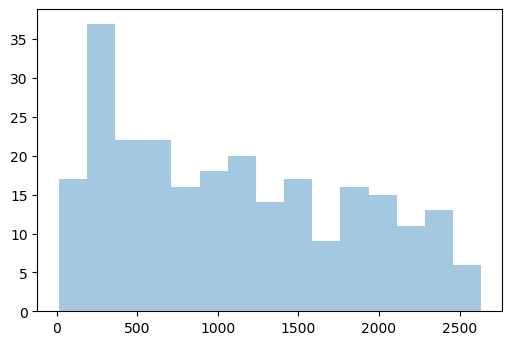

In [290]:
# --- Plot for one snapshot ---
i1=0;
i2=1;
t=2;

X_all = X_all_all[i1][i2][:, t];
Y_all = Y_all_all[i1][i2][:, t];
# pairwise distances between cells
incl_self = 0; # include self-pairs of the form [i,i]?
# loop j over range(i+1) to include self-pairs, or range(i) to exclude self-pairs
X_all_paired = np.array([ [X_all[i], X_all[j]] for i in range(len(X_all)) for j in range(i+incl_self)]);
Y_all_paired = np.array([ [Y_all[i], Y_all[j]] for i in range(len(X_all)) for j in range(i+incl_self)]);
def f(x, y):
    return np.sqrt((x[0]-x[1])**2 + (y[0]-y[1])**2)
pairwise_dist_all = np.array(list(map(f, X_all_paired, Y_all_paired )) );

# -- Verify that this yields the pair-wise elements of an array --
# data_all = np.array([[i, j] for i in range(10) for j in range(i+1)]).T;
# plt.scatter( data_all[0], data_all[1]  )
plt.figure(dpi=100)
plt.hist(pairwise_dist_all, bins=15, alpha = 0.4)
plt.show()

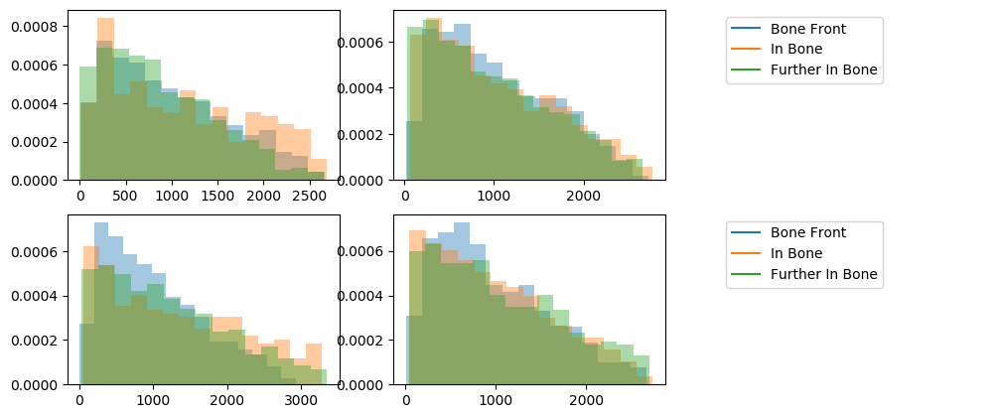

In [293]:
# --- plot for all results ---
t=0;
incl_self = 0; # include self?

pairwise_dist_all_all = [[None]*N_files_per_video for _ in range(N_videos)];
fig, axs = plt.subplots(2, 3, figsize=(12, 5), dpi=100)
for i1 in range(N_videos):
    [ix, iy] = divmod(i1, 2)
    for i2 in range(N_files_per_video):
        X_all = X_all_all[i1][i2][:, t];
        Y_all = Y_all_all[i1][i2][:, t];
        # pairwise distances between cells
        incl_self = 0; # include self-pairs of the form [i,i]?
        # loop j over range(i+1) to include self-pairs, or range(i) to exclude self-pairs
        X_all_paired = np.array([ [X_all[i], X_all[j]] for i in range(len(X_all)) for j in range(i+incl_self)]);
        Y_all_paired = np.array([ [Y_all[i], Y_all[j]] for i in range(len(Y_all)) for j in range(i+incl_self)]);
        def f(x, y):
            return np.sqrt((x[0]-x[1])**2 + (y[0]-y[1])**2)
        pairwise_dist_all = np.array(list(map(f, X_all_paired, Y_all_paired )) );
        
        # store for later use
        pairwise_dist_all_all[i1][i2] = pairwise_dist_all; 
        
        # plot histogram
        axs[ix, iy].hist(pairwise_dist_all, bins=15, alpha = 0.4, density=True)
        
# --- legend ---
for row in range(2):
    for i, this_label in enumerate(names_compare):
        axs[row, 2].plot(np.nan, label=this_label)
    axs[row, 2].legend(loc='upper left')
    axs[row, 2].axis('off')